In [1]:
# часть 1. Импорт зависимостей

# Jupyter notebook related
%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Basics of Python data handling and visualization
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
from shapely.geometry import Polygon

# Basics of GIS
import geopandas as gpd

# The core of this example
from eolearn.core import EOTask, EOPatch, LinearWorkflow, FeatureType, OverwritePermission, LoadFromDisk, SaveToDisk, EOExecutor
from eolearn.io import S2L1CWCSInput, ExportToTiff
from eolearn.mask import AddCloudMaskTask, get_s2_pixel_cloud_detector, AddValidDataMaskTask
from eolearn.geometry import VectorToRaster, PointSamplingTask, ErosionTask
from eolearn.features import LinearInterpolation, SimpleFilterTask
from sentinelhub import BBoxSplitter, BBox, CRS, CustomUrlParam

# Machine learning
import lightgbm as lgb
from sklearn.externals import joblib
from sklearn import metrics
from sklearn import preprocessing

# Misc
import pickle
import sys
import os
import datetime
import itertools
from tqdm import tqdm_notebook as tqdm
import enum

# Basik math
from math import sqrt

In [2]:
# часть 2. Импорт зависимостей

# Загрузить файл с изучаемой территорией
country = gpd.read_file('D:/YandexDisk/курсач_4/obrovo/border.shp') 

# Конвертирование CRS в UTM_35N
country_crs = CRS.UTM_33N
country = country.to_crs(crs={'init': CRS.ogc_string(country_crs)})

# Получение полигонального объекта с формой
country_shape = country.geometry.values.tolist()[-1]

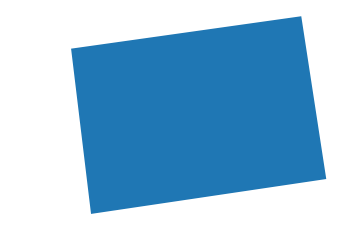

In [3]:
#2.1

# Plot country
country.plot()
plt.axis('off');

In [4]:
#2.2

# Print size
print('Dimension of the area is {0:.0f} x {1:.0f} m2'.format(country_shape.bounds[2] - country_shape.bounds[0],
                                                             country_shape.bounds[3] - country_shape.bounds[1]))

Dimension of the area is 20701 x 16036 m2


In [5]:
#2.3

use_smaller_patches = True

# Create the splitter to obtain a list of bboxes
bbox_splitter_large = BBoxSplitter([country_shape], country_crs, (4, 3))
bbox_splitter_small = BBoxSplitter([country_shape], country_crs, (4 * 3, 3 * 3))

bbox_splitter = bbox_splitter_small if use_smaller_patches else bbox_splitter_large

bbox_list = np.array(bbox_splitter.get_bbox_list())
info_list = np.array(bbox_splitter.get_info_list())

In [6]:
# часть 3. Выбор центрального контейнера

ID = 37 if use_smaller_patches else 190

# Obtain surrounding patches
patchIDs = []
for idx, [bbox, info] in enumerate(zip(bbox_list, info_list)):
    if (abs(info['index_x'] - info_list[ID]['index_x']) <= 1 and
        abs(info['index_y'] - info_list[ID]['index_y']) <= 1):
        patchIDs.append(idx)
        
# Check if final size is 3x3
if len(patchIDs) != 9:
    print('Warning! Use a different central patch ID, this one is on the border.')  

# Change the order of the patches (used for plotting later)
patchIDs = np.transpose(np.fliplr(np.array(patchIDs).reshape(3, 3))).ravel()   

# Prepare info of selected EOPatches
geometry = [Polygon(bbox.get_polygon()) for bbox in bbox_list[patchIDs]]
idxs_x = [info['index_x'] for info in info_list[patchIDs]]
idxs_y = [info['index_y'] for info in info_list[patchIDs]]
df = pd.DataFrame({'index_x': idxs_x, 'index_y': idxs_y})
gdf = gpd.GeoDataFrame(df,
                       crs={'init': CRS.ogc_string(country_crs)},
                       geometry=geometry)

In [7]:
#3.1

# save to shapefile
shapefile_name = './selected_3x3_bboxes_dist_small_2.shp' if use_smaller_patches \
    else './selected_3x3_bboxes_dist_large_2.shp'
gdf.to_file(shapefile_name)

In [8]:
#3.2

poly = gdf['geometry'][0]
x1, y1, x2, y2 = poly.bounds
aspect_ratio = (y1 - y2) / (x1 - x2)

# содержиме датафрейма
gdf.head()

,index_x,index_y,geometry
0,3,5,"POLYGON ((1227966.810807306 5835314.334527461,..."
1,4,5,"POLYGON ((1229691.879821837 5835314.334527461,..."
2,5,5,"POLYGON ((1231416.948836369 5835314.334527461,..."
3,3,4,"POLYGON ((1227966.810807306 5833532.52524568, ..."
4,4,4,"POLYGON ((1229691.879821837 5833532.52524568, ..."


In [9]:
#3.3

fontdict = {'family': 'monospace', 'weight': 'normal', 'size': 11}

# if bboxes have all same size, estimate offset
xl, yl, xu, yu = gdf.geometry[0].bounds
xoff, yoff = (xu - xl) / 3, (yu - yl) / 5

(1221756.5623549926, 1244527.4733468073, 5825603.473941754, 5843243.385831387)

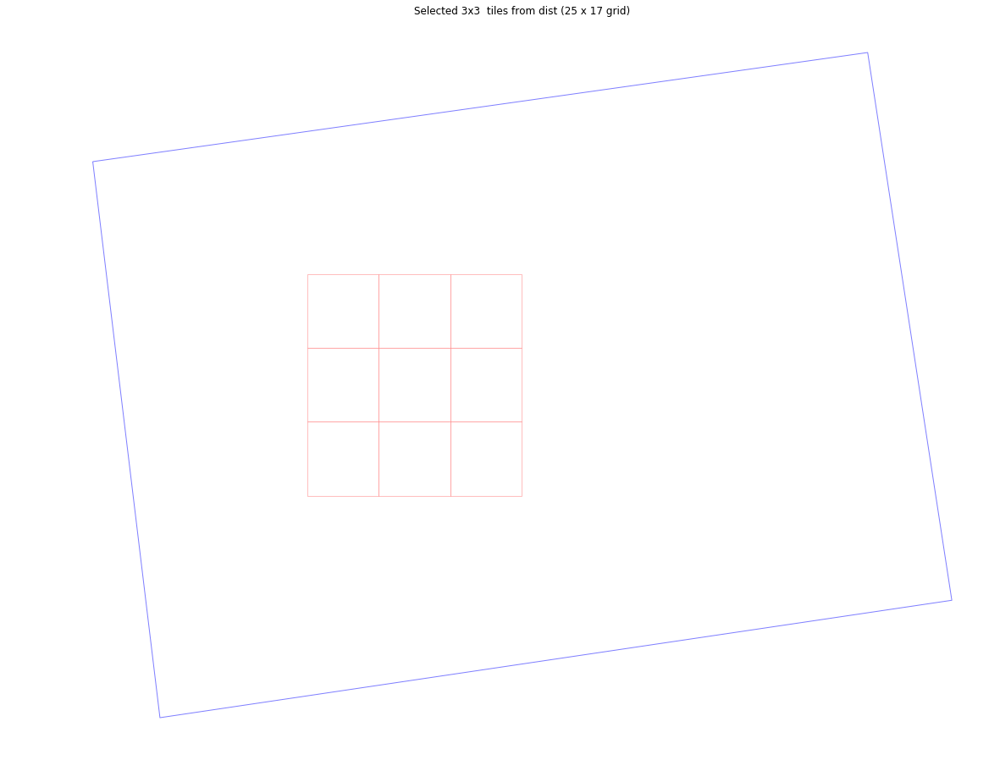

In [10]:
#3.4

# figure
fig, ax = plt.subplots(figsize=(20, 20))
gdf.plot(ax=ax,facecolor='w',edgecolor='r',alpha=0.5)
country.plot(ax=ax, facecolor='w',edgecolor='b',alpha=0.5)
ax.set_title('Selected 3x3  tiles from dist (25 x 17 grid)');
plt.axis('off')

In [11]:
# часть 4. Описание задач рабочего процесса

class SentinelHubValidData:
    """
    Combine Sen2Cor's classification map with `IS_DATA` to define a `VALID_DATA_SH` mask
    The SentinelHub's cloud mask is asumed to be found in eopatch.mask['CLM']
    """
    def __call__(self, eopatch):
        return np.logical_and(eopatch.mask['IS_DATA'].astype(np.bool),
                              np.logical_not(eopatch.mask['CLM'].astype(np.bool)))

class CountValid(EOTask):
    """
    The task counts number of valid observations in time-series and stores the results in the timeless mask.
    """
    def __init__(self, count_what, feature_name):
        self.what = count_what
        self.name = feature_name

    def execute(self, eopatch):
        eopatch.add_feature(FeatureType.MASK_TIMELESS, self.name, np.count_nonzero(eopatch.mask[self.what],axis=0))

        return eopatch
    
class DifferenceVegetationIndex(EOTask):
    """
    DVI = A - B.
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]

        dvi = (band_a - band_b)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, dvi[..., np.newaxis])

        return eopatch    


class NormalizedDifferenceIndex(EOTask):
    """
    The tasks calculates user defined Normalised Difference Index (NDI) between two bands A and B as:
    NDI = (A-B)/(A+B).
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]

        ndi = (band_a - band_b) / (band_a  + band_b)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, ndi[..., np.newaxis])

        return eopatch

class TransformedNormalizedDifferenceIndex(EOTask):
    """
    TNDVI = sqrt((A-B)/(A+B)+0.5).
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]

        tndvi = np.sqrt((band_a - band_b) / (band_a  + band_b) + 0.5)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, tndvi[..., np.newaxis])

        return eopatch

class DifferenceIndexSimpleRatio(EOTask):
    """
    DI = A / B.
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]

        di = (band_a / band_b)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, di[..., np.newaxis])

        return eopatch        

class TransformSimpleRatio(EOTask):
    """
    TSR = sqrt(A / B).
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]

        tsr = np.sqrt(band_a / band_b)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, tsr[..., np.newaxis])

        return eopatch      
    
class GlobalEnvironmentMonitoringIndex(EOTask):
    """
    GEMI: E*(1-0.25*E)-(b3-0.125)/(1-b3) 
    E = 2*(((b4)^2-(b3)^2 )+1.5*b4+0.5*b3)/(b4+b3+0.5).
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]

        e = 2*((band_a**2 - band_b**2) + 1.5*band_a + 0.5*band_b)/(band_a + band_b + 0.5)
        gemi = e*(1-0.25*e)-(band_b - 0.125)/(1 - band_b)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, gemi[..., np.newaxis])

        return eopatch      
    
class AtmosphereResistantVegetationIndex(EOTask):
    """
    ARVI=(b4-(2*b3-b1))/(b4+(2*b3-b1)).
    """
    def __init__(self, feature_name, band_a, band_b, band_c):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_c_fetaure_name = band_c.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        self.band_c_fetaure_idx = int(band_c.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        band_c = eopatch.data[self.band_c_fetaure_name][..., self.band_c_fetaure_idx]

        arvi = (band_a - (2*band_b - band_c))/(band_a + (2*band_b - band_c))

        eopatch.add_feature(FeatureType.DATA, self.feature_name, arvi[..., np.newaxis])

        return eopatch    
    
class SoilAdjustedVegetationIndex(EOTask):
    """
    SAVI=(L+1)*(b4-b3)/(b4+b3+L)
    L = variable of vegetation density.
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]

        L = 0.7
        savi = (L + 1)*(band_a - band_b)/(band_a + band_b +L)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, savi[..., np.newaxis])

        return eopatch   
    
class ExtendedVegetationIndex(EOTask):
    """
    EVI=2.5*(b4-b3)/(b4+6*b3-7.5*b1+1).
    """
    def __init__(self, feature_name, band_a, band_b, band_c):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_c_fetaure_name = band_c.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])
        self.band_c_fetaure_idx = int(band_c.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]
        band_c = eopatch.data[self.band_c_fetaure_name][..., self.band_c_fetaure_idx]

        evi = 2.5*(band_a - band_b)/(band_a + 6*band_b - 7.5*band_c + 1)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, evi[..., np.newaxis])

        return eopatch    
    
class ModifiedSoilAdjustedVegetationIndex(EOTask):
    """
    MSAVI=(L+1)*(b4-b3)/(b4+b3+L)
    L = 1-(2*b4+1-√((2*b4+1)^2-8*b4*b3))/2.
    """
    def __init__(self, feature_name, band_a, band_b):
        self.feature_name = feature_name
        self.band_a_fetaure_name = band_a.split('/')[0]
        self.band_b_fetaure_name = band_b.split('/')[0]
        self.band_a_fetaure_idx = int(band_a.split('/')[-1])
        self.band_b_fetaure_idx = int(band_b.split('/')[-1])

    def execute(self, eopatch):
        band_a = eopatch.data[self.band_a_fetaure_name][..., self.band_a_fetaure_idx]
        band_b = eopatch.data[self.band_b_fetaure_name][..., self.band_b_fetaure_idx]

        L = 1-(2*band_a + 1 - sqrt((2*band_a+1)**2-8*band_a * band_b)) / 2
        msavi = (L + 1)*(band_a - band_b)/(band_a + band_b +L)

        eopatch.add_feature(FeatureType.DATA, self.feature_name, msavi[..., np.newaxis])

        return eopatch   
        
    
class EuclideanNorm(EOTask):
    """
    The tasks calculates Euclidian Norm of all bands within an array:
    norm = sqrt(sum_i Bi**2),
    where Bi are the individual bands within user-specified feature array.
    """
    def __init__(self, feature_name, in_feature_name):
        self.feature_name = feature_name
        self.in_feature_name = in_feature_name

    def execute(self, eopatch):
        arr = eopatch.data[self.in_feature_name]
        norm = np.sqrt(np.sum(arr**2, axis=-1))

        eopatch.add_feature(FeatureType.DATA, self.feature_name, norm[..., np.newaxis])
        return eopatch
    
# Определение задач рабочего процесса
# TASK FOR BAND DATA
# add a request for B(B02), G(B03), R(B04), NIR (B08), SWIR1(B11), SWIR2(B12)
# from default layer 'ALL_BANDS' at 10m resolution
# Here we also do a simple filter of cloudy scenes. A detailed cloud cover
# detection is performed in the next step
custom_script = 'return [B02, B03, B04, B08, B11, B12];'
add_data = S2L1CWCSInput(
    layer='BANDS-S2-L1C',
    feature=(FeatureType.DATA, 'BANDS'), # save under name 'BANDS'
    custom_url_params={CustomUrlParam.EVALSCRIPT: custom_script}, # custom url for 6 specific bands
    resx='10m', # resolution x
    resy='10m', # resolution y
    maxcc=0.8, # maximum allowed cloud cover of original ESA tiles
)

# Задача на расчет маски облачности
# cloud detection is performed at 80m resolution
# and the resulting cloud probability map and mask
# are scaled to EOPatch's resolution
cloud_classifier = get_s2_pixel_cloud_detector(average_over=2, dilation_size=1, all_bands=False)
add_clm = AddCloudMaskTask(cloud_classifier, 'BANDS-S2CLOUDLESS', cm_size_y='80m', cm_size_x='80m',
                           cmask_feature='CLM', # cloud mask name
                           cprobs_feature='CLP' # cloud prob. map name
                          )

# Задача на расчет новых признаков
# DVI: (B08 - B04)
# NDVI: (B08 - B04)/(B08 + B04)
# DI: (B08 / B04)
# NDWI: (B03 - B08)/(B03 + B08)
# NORM: sqrt(B02^2 + B03^2 + B04^2 + B08^2 + B11^2 + B12^2)
# TNDVI: sqrt((B08 - B04)/(B08 + B04) + 0.5)
# TSR: sqrt(B08 / B04)
# GEMI: E*(1-0.25*E)-(B04-0.125)/(1-B04),  E = 2*(((B08)^2-(B04)^2 )+1.5*B08+0.5*B04)/(B08+B04+0.5)
# ARVI: (B08-(2*B04-B02))/(b4+(2*B04-B02))
# SAVI: (L + 1)*(B08 - B04)/(B08 + B04 +L)
# EVI: 2.5*(B08 - B04)/(B08 + 6*B04 - 7.5*B02 + 1)
# MSAVI: (L + 1)*(B08 - B04)/(B08 + B04 +L), L = 1-(2*B08 + 1 - sqrt((2*B08+1)**2-8*B08 * B04)) / 2
dvi = DifferenceVegetationIndex('DVI', 'BANDS/3','BANDS/2')
ndvi = NormalizedDifferenceIndex('NDVI', 'BANDS/3', 'BANDS/2')
di = DifferenceIndexSimpleRatio('DI', 'BANDS/3', 'BANDS/2')
tsr = TransformSimpleRatio('TSR', 'BANDS/3', 'BANDS/2')
ndwi = NormalizedDifferenceIndex('NDWI', 'BANDS/1', 'BANDS/3')
norm = EuclideanNorm('NORM','BANDS')
tndvi = TransformedNormalizedDifferenceIndex('TNDVI', 'BANDS/3', 'BANDS/2')
gemi = GlobalEnvironmentMonitoringIndex('GEMI', 'BANDS/3', 'BANDS/2')
arvi = AtmosphereResistantVegetationIndex('ARVI', 'BANDS/3', 'BANDS/2', 'BANDS/0')
savi = SoilAdjustedVegetationIndex('SAVI', 'BANDS/3', 'BANDS/2')
evi = ExtendedVegetationIndex('EVI', 'BANDS/3', 'BANDS/2', 'BANDS/0')
msavi = SoilAdjustedVegetationIndex('MSAVI', 'BANDS/3', 'BANDS/2')

# Задача на маску действительных пикселей
# validate pixels using SentinelHub's cloud detection mask and region of acquisition
add_sh_valmask = AddValidDataMaskTask(SentinelHubValidData(),
                                      'IS_VALID' # name of output mask
                                     )

# Задача на валидацию пикселей
# count number of valid observations per pixel using valid data mask
count_val_sh = CountValid('IS_VALID', # name of existing mask
                          'VALID_COUNT' # name of output scalar
                         )

# Задача на сохранение вывода (опционально)
path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'
if not os.path.isdir(path_out):
    os.makedirs(path_out)
save = SaveToDisk(path_out, overwrite_permission=OverwritePermission.OVERWRITE_PATCH)

In [12]:
# часть 5. Загрузка справочной карты

# Определение классов земного покрова справочной карты

class LULC(Enum):
    NO_DATA            = (0,  'No Data',            'white')
    ROAD               = (1,  'Road',               'xkcd:lime')
    FOREST             = (2,  'Unclass_forest',     'xkcd:olive')
    SETTLEMENT         = (3,  'Settlement',         'orange')
    FIELDS             = (4,  'Fields',             'xkcd:tan')
    WATER              = (5,  'Water',              'xkcd:azure')    
    FOREST_DUB         = (6,  'Dub',                'xkcd:darkgreen')
    FOREST_GRAB        = (7,  'Grab',               'xkcd:green')
    FOREST_SOSNA       = (8,  'Sosna',              'xkcd:khaki')
    FOREST_MELKOL      = (9,  'Melkolistv',         'xkcd:navy')
    FOREST_BEREZA      = (10, 'Bereza',             'xkcd:plum')
    
    def __init__(self, val1, val2, val3):
        self.id = val1
        self.class_name = val2
        self.color = val3

# Reference colormap things
lulc_cmap = mpl.colors.ListedColormap([entry.color for entry in LULC])
lulc_norm = mpl.colors.BoundaryNorm(np.arange(-0.5, 11, 1), lulc_cmap.N)

land_cover_path = 'D:/YandexDisk/курсач_4/obrovo/correct_vyd1.shp' if use_smaller_patches \
    else 'D:/YandexDisk/курсач_4/obrovo/correct_vyd1.shp'

land_cover = gpd.read_file(land_cover_path)

# Приведение координатной системы к UTM_35N
# Convert CRS to UTM_35N
country_crs = CRS.UTM_33N
land_cover = land_cover.to_crs(crs={'init': CRS.ogc_string(country_crs)})

land_cover_val = [0,1,2,3,4,5,6,7,8,9,10]
land_cover_array = []
for val in land_cover_val:
    temp = land_cover[land_cover.lulcid == val]
    temp.reset_index(drop=True, inplace=True)
    land_cover_array.append(temp)
    del temp

rshape = (FeatureType.MASK, 'IS_VALID')

land_cover_task_array = []
for el, val in zip(land_cover_array, land_cover_val):
    land_cover_task_array.append(VectorToRaster(
        feature=(FeatureType.MASK_TIMELESS, 'LULC'),
        vector_data=el,
        raster_value=val,
        raster_shape=rshape,
        raster_dtype=np.uint8))

In [13]:
# часть 6. Формирование рабочего процесса

# Определение рабочего процесса - EOWorkflow из EOTask 
workflow = LinearWorkflow(
    add_data,
    add_clm,
    dvi,
    ndvi,
    di,
    tsr,
    gemi,
    arvi,
    savi,
    evi,
    msavi,
    ndwi,
    tndvi,
    norm,
    add_sh_valmask,
    count_val_sh,
    *land_cover_task_array,
    save
)

In [14]:
#6.1

%%time

# Запуск рабочего процесса
time_interval = ['2018-05-08', '2018-05-15'] # time interval for the SH request

# Панель статуса
pbar = tqdm(total=len(patchIDs))
for idx, bbox in enumerate(bbox_list[patchIDs]):

    # Дополнительные параметры рабочего процесса
    extra_param = {
        add_data:{'bbox': bbox, 'time_interval': time_interval},
        save: {'eopatch_folder': 'eopatch_{}'.format(idx)}
    }

    workflow.execute(extra_param)
    pbar.update(1)

Wall time: 26.1 s


In [15]:
#6.2

# Внутренняя структура базовой рабочей единицы - EOPatch после завершения рабочего процесса

EOPatch.load('./eopatches_small/eopatch_0/')

EOPatch(
  data: {
    ARVI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    BANDS: numpy.ndarray(shape=(2, 178, 173, 6), dtype=float32)
    CLP: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    DI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    DVI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    EVI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    GEMI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    MSAVI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    NDVI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    NDWI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    NORM: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    SAVI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    TNDVI: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
    TSR: numpy.ndarray(shape=(2, 178, 173, 1), dtype=float32)
  }
  mask: {
    CLM: numpy.ndarray(shape=(2, 178, 173, 1), dtype=bool)
    IS_DATA: numpy.ndarray(sh

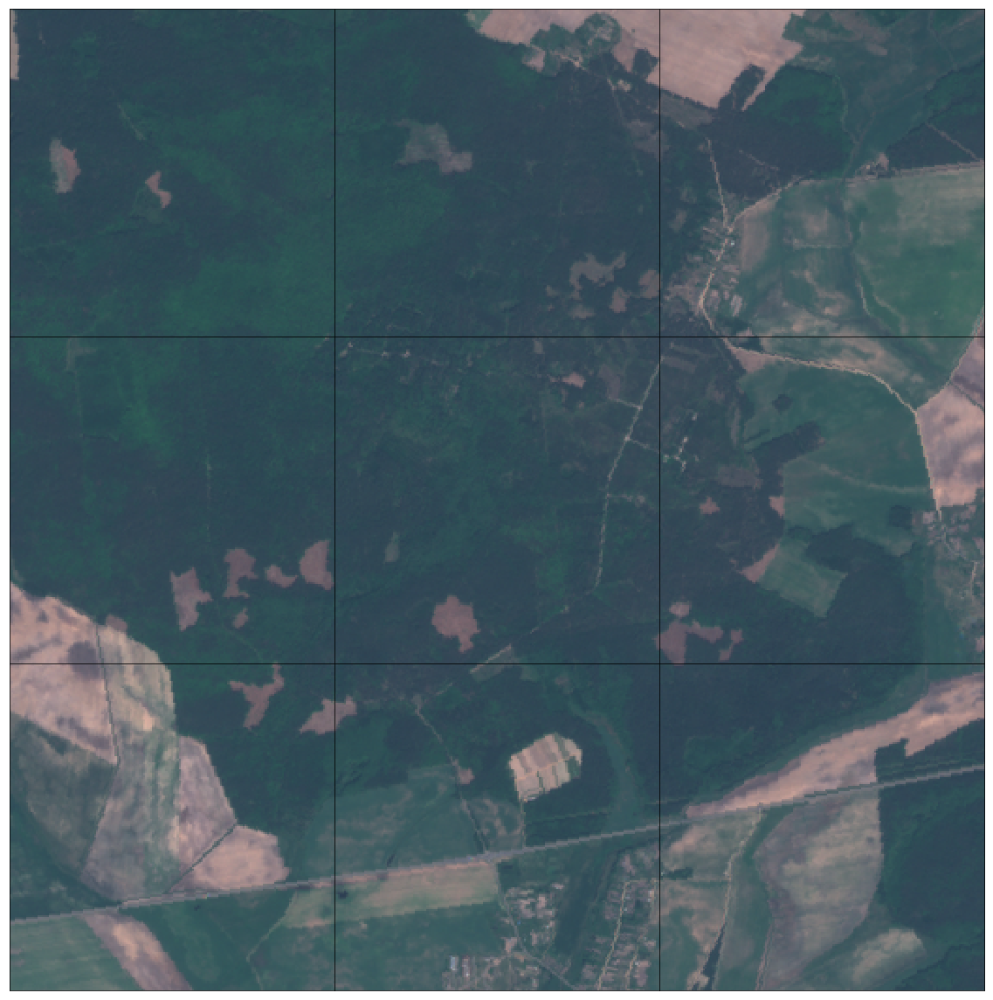

In [16]:
# часть 7. Синтез и отображение RGB композита  
path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'
fig = plt.figure(figsize=(20, 20 * aspect_ratio))

pbar = tqdm(total=9)
for i in range(9):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(np.clip(eopatch.data['BANDS'][0][..., [2, 1, 0]] * 3.5, 0, 1))
    plt.xticks([])
    plt.yticks([])
    ax.set_aspect("auto")
    pbar.update(1)
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

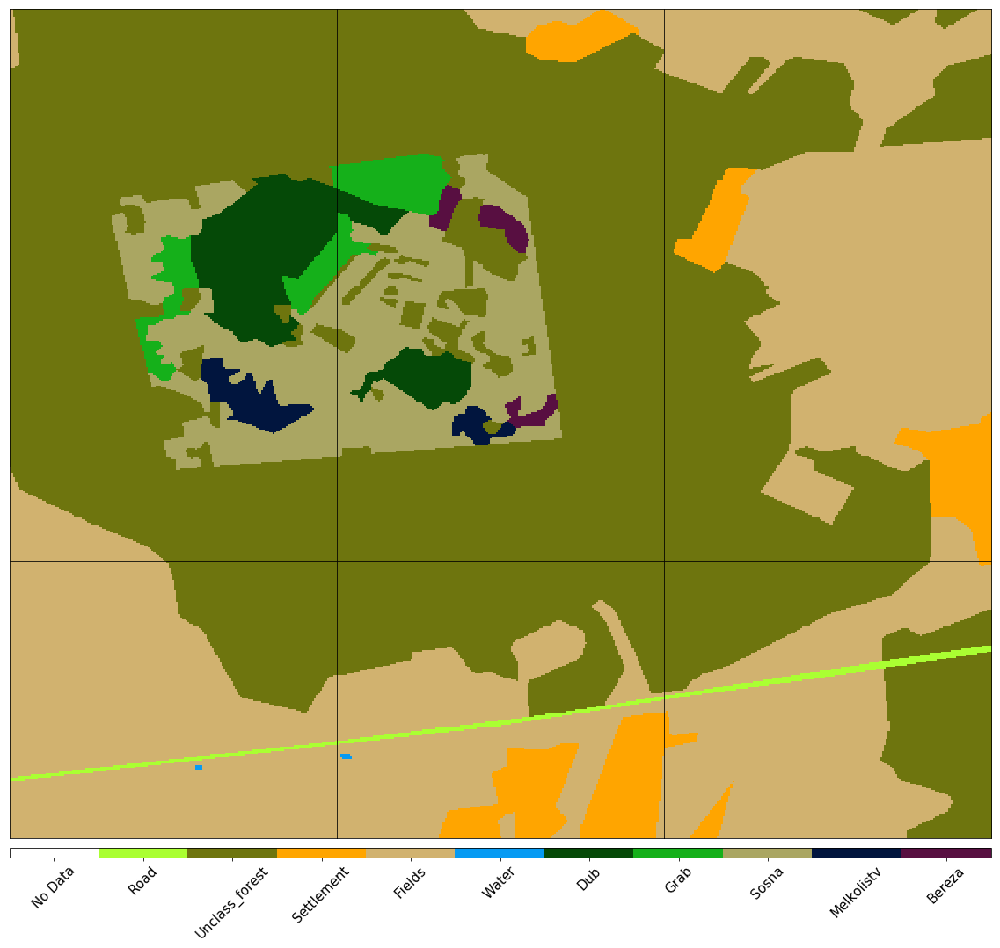

In [17]:
# часть 8. Визуализация справочной карты

# *Справочная карта заменяет собой план землепользования здорового человека

path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'

fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

pbar = tqdm(total=9)
for i, ax in enumerate(axes.flat):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    im = ax.imshow(eopatch.mask_timeless['LULC'].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    pbar.update(1)
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_xticklabels([entry.class_name for entry in LULC], rotation=45, fontsize=15)
plt.show()

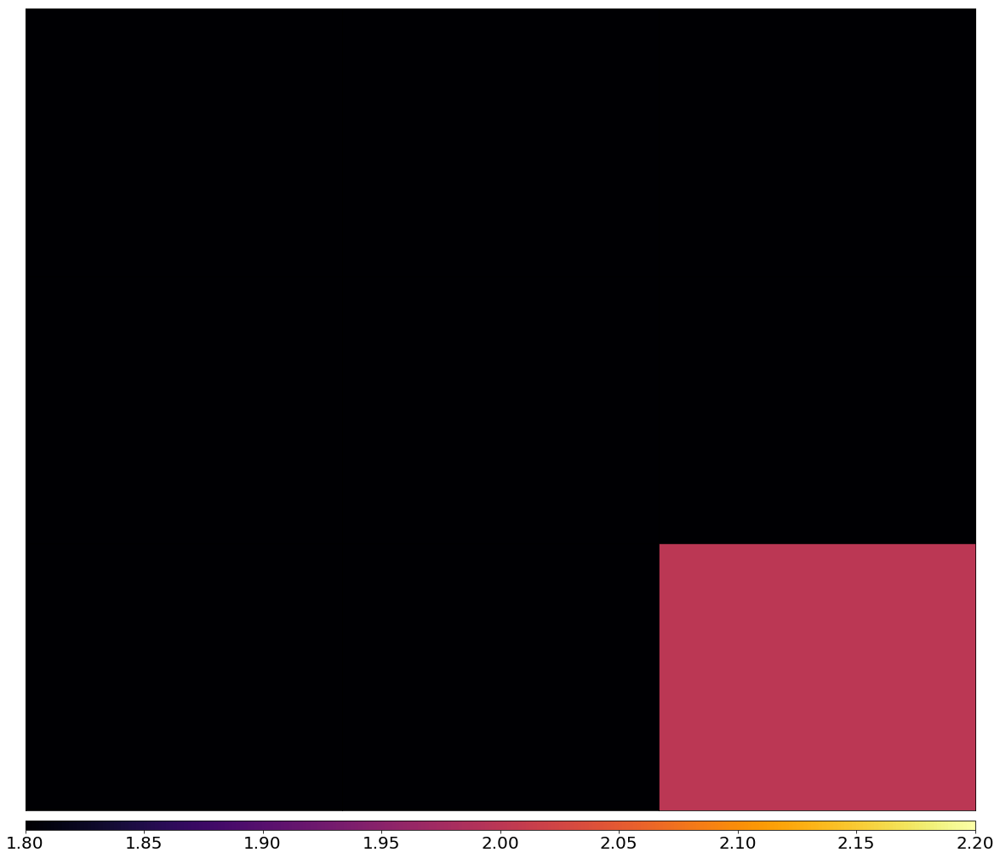

In [18]:
# часть 9. Составление карты десйствительного количества пикселей

path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'

vmin, vmax = None, None
for i in range(9):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    data = eopatch.mask_timeless['VALID_COUNT'].squeeze()
    vmin = np.min(data) if vmin is None else (np.min(data) if np.min(data) < vmin else vmin)
    vmax = np.max(data) if vmax is None else (np.max(data) if np.max(data) > vmax else vmax)

fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

pbar = tqdm(total=9)
for i, ax in enumerate(axes.flat):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    im = ax.imshow(eopatch.mask_timeless['VALID_COUNT'].squeeze(), vmin=vmin, vmax=vmax, cmap=plt.cm.inferno)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    pbar.update(1)
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

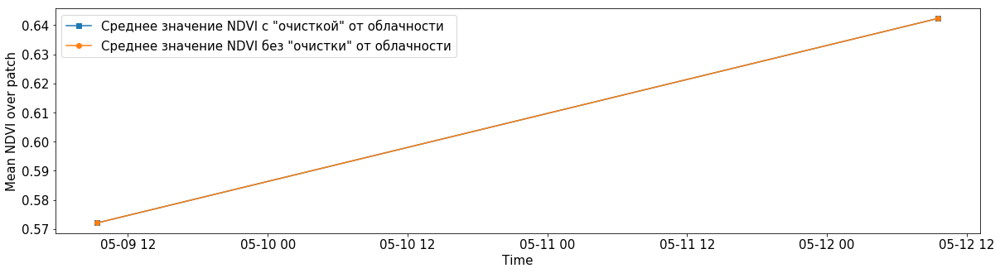

In [19]:
# часть 10. Построение среднего значения NDVI 

# Среднее значение NDVI строится исходя из того, что в заданные временные сроки попадает более 1 залёта

path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'

eID = 1
eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, eID), lazy_loading=True)

ndvi = eopatch.data['NDVI'] # ndvi data cube
mask = eopatch.mask['IS_VALID'] # маска действительных пикселей
time = np.array(eopatch.timestamp) # ось x 
t, w, h, _ = ndvi.shape

ndvi_clean = ndvi.copy()
ndvi_clean[~mask] = np.nan # set values of invalid pixels to NaN's

# Расчет среднего значения, удаление NaN из массива средних значений
ndvi_mean = np.nanmean(ndvi.reshape(t, w * h).squeeze(), axis=1)
ndvi_mean_clean = np.nanmean(ndvi_clean.reshape(t, w * h).squeeze(), axis=1)
time_clean = time[~np.isnan(ndvi_mean_clean)]
ndvi_mean_clean = ndvi_mean_clean[~np.isnan(ndvi_mean_clean)]

fig = plt.figure(figsize=(20,5))
plt.plot(time_clean, ndvi_mean_clean, 's-', label = 'Среднее значение NDVI с "очисткой" от облачности')
plt.plot(time, ndvi_mean, 'o-', label='Среднее значение NDVI без "очистки" от облачности')
plt.xlabel('Time', fontsize=15)
plt.ylabel('Mean NDVI over patch', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.legend(loc=2, prop={'size': 15});

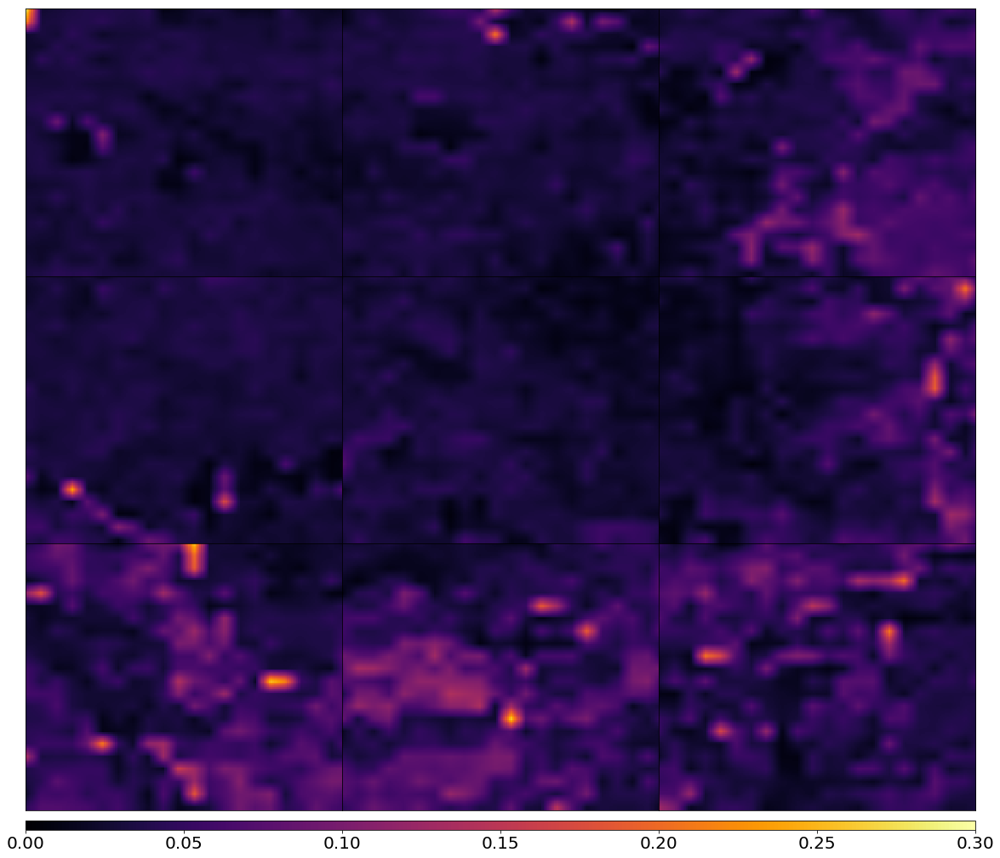

In [20]:
# часть 11. Построение графика средней вероятности облаков

path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'

fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

pbar = tqdm(total=9)
for i, ax in enumerate(axes.flat):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    clp = eopatch.data['CLP']
    mask = eopatch.mask['IS_VALID']
    clp[~mask] = np.nan
    clp_mean = np.nanmean(clp, axis=0).squeeze()
    im = ax.imshow(clp_mean, vmin=0.0, vmax=0.3, cmap=plt.cm.inferno)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    pbar.update(1)
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
plt.show()

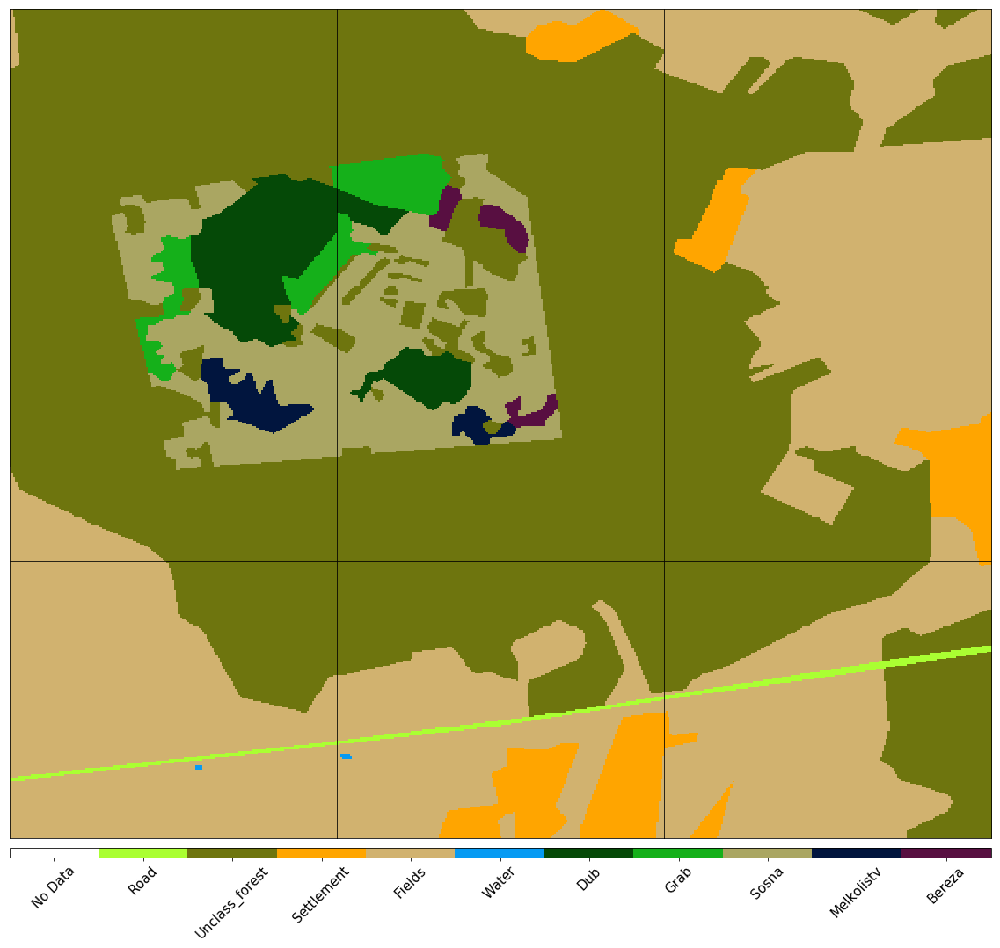

In [23]:
# Визуализация справочной карты
# *Справочная карта заменяет собой план землепользования здорового человека

path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'

fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

pbar = tqdm(total=9)
for i, ax in enumerate(axes.flat):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    im = ax.imshow(eopatch.mask_timeless['LULC'].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    pbar.update(1)
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_xticklabels([entry.class_name for entry in LULC], rotation=45, fontsize=15)
plt.show()

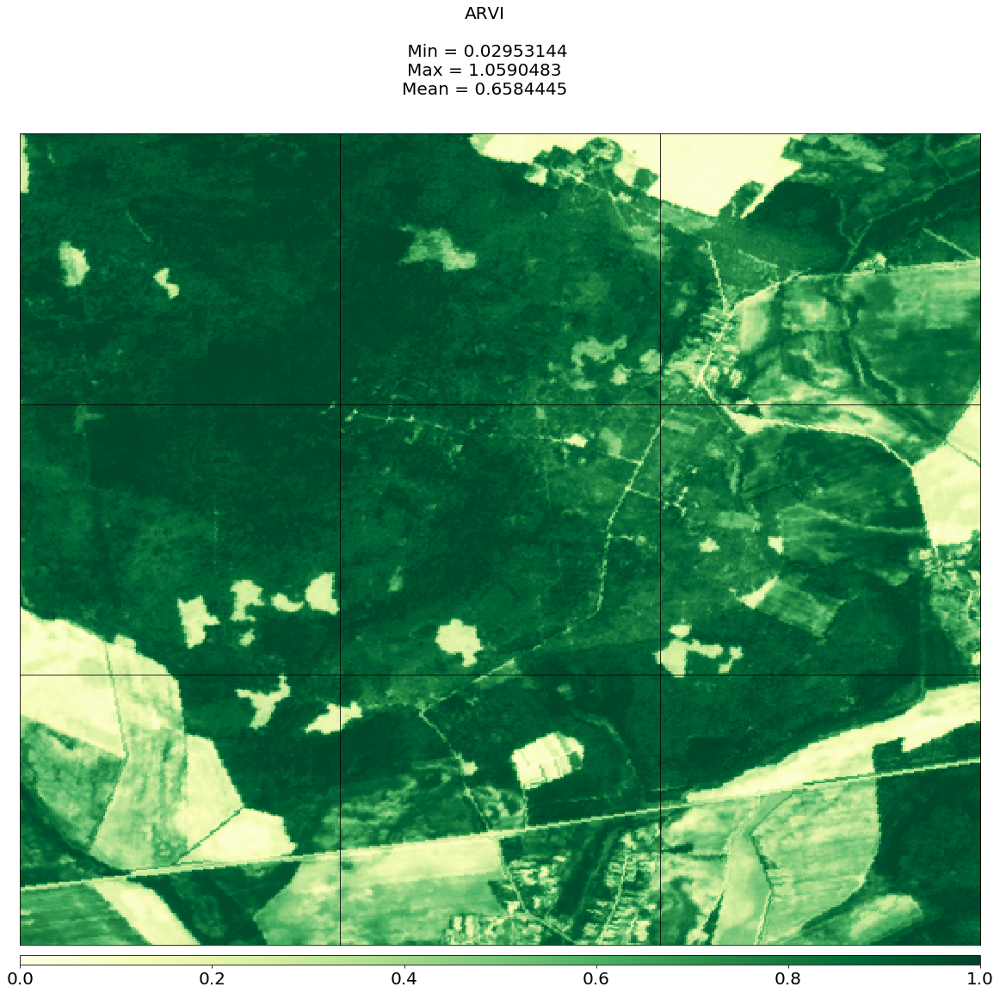

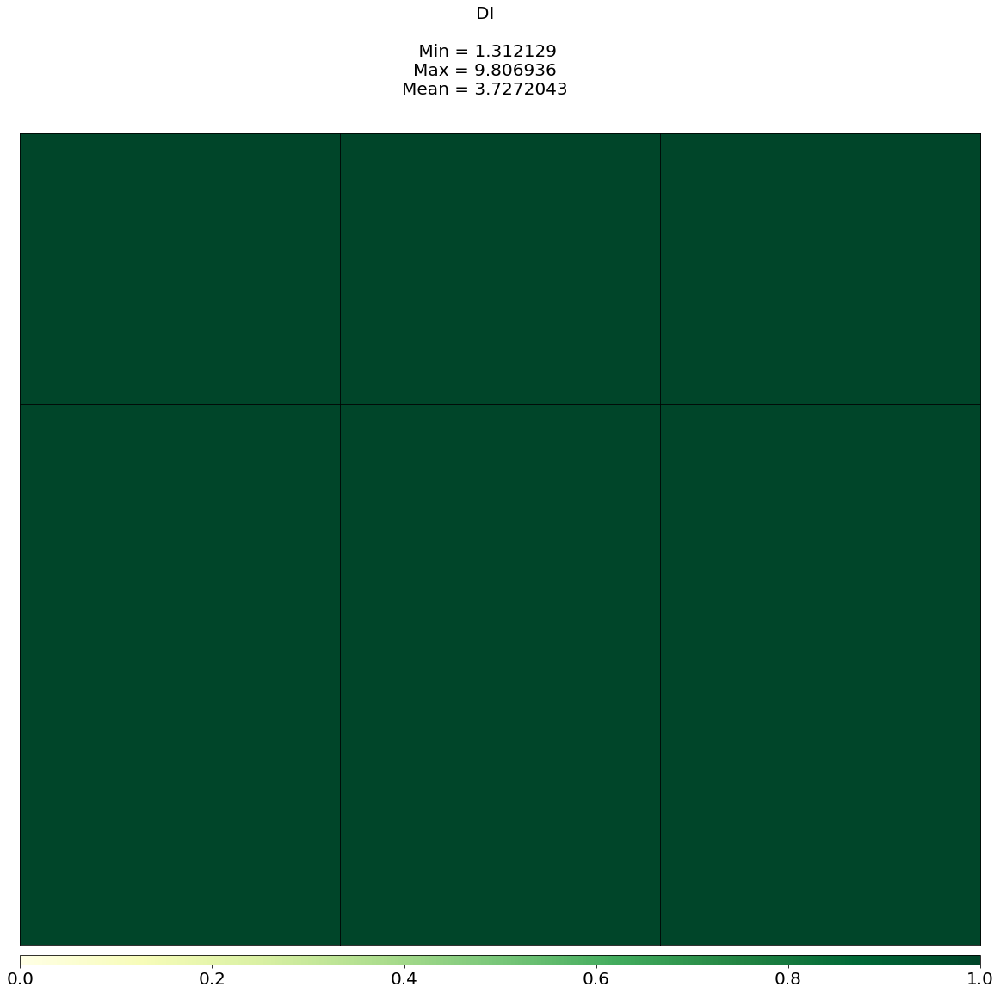

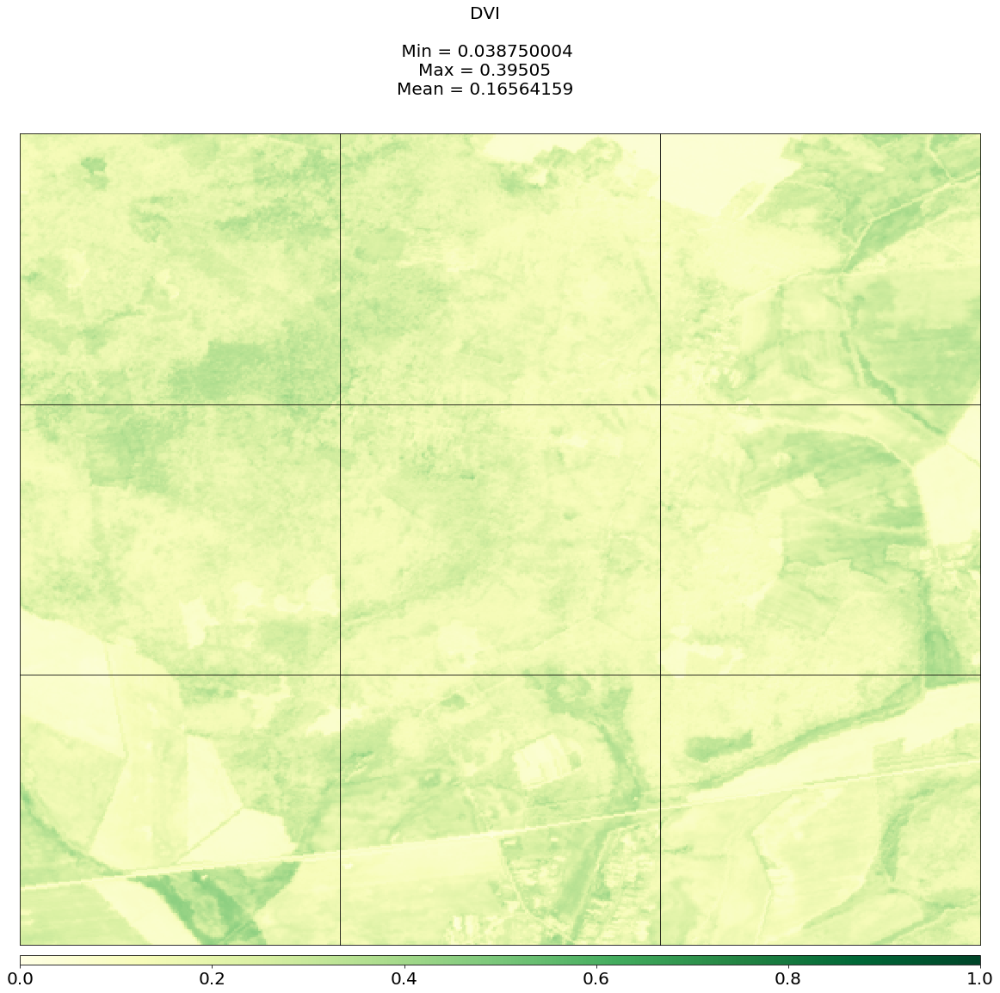

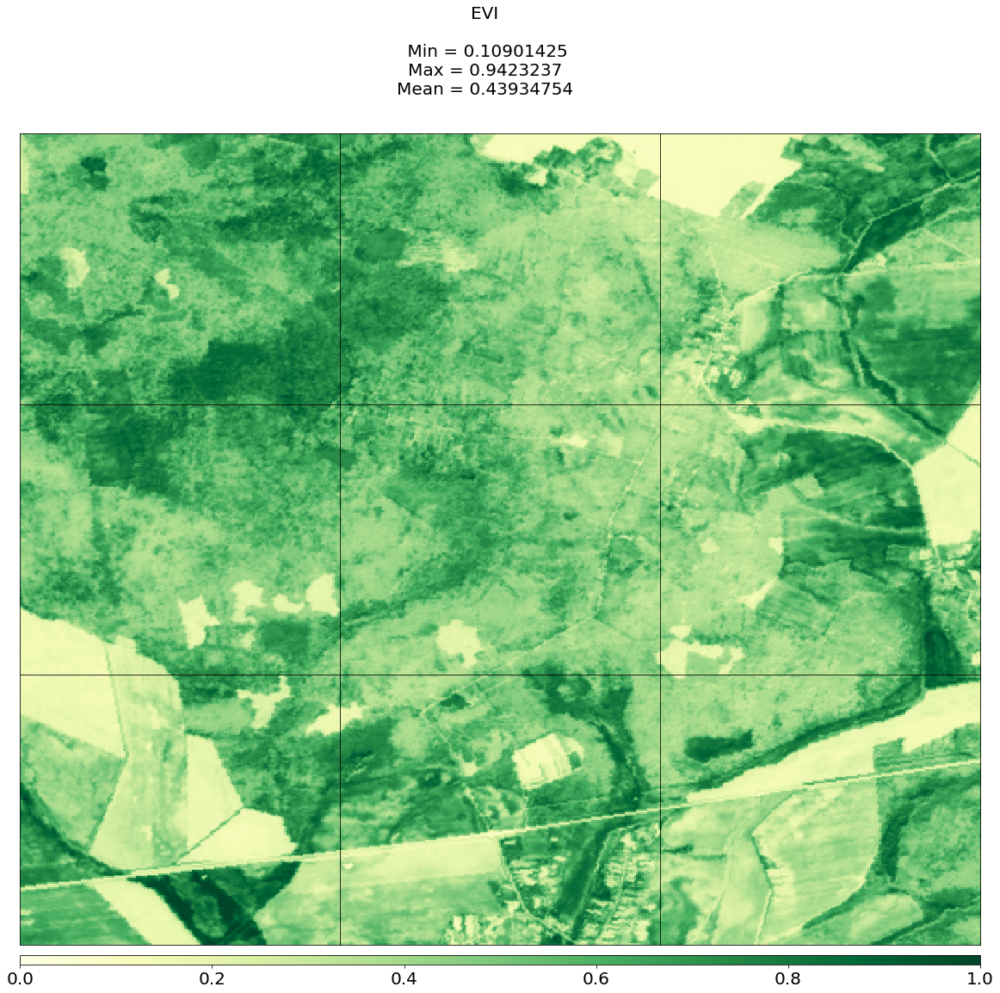

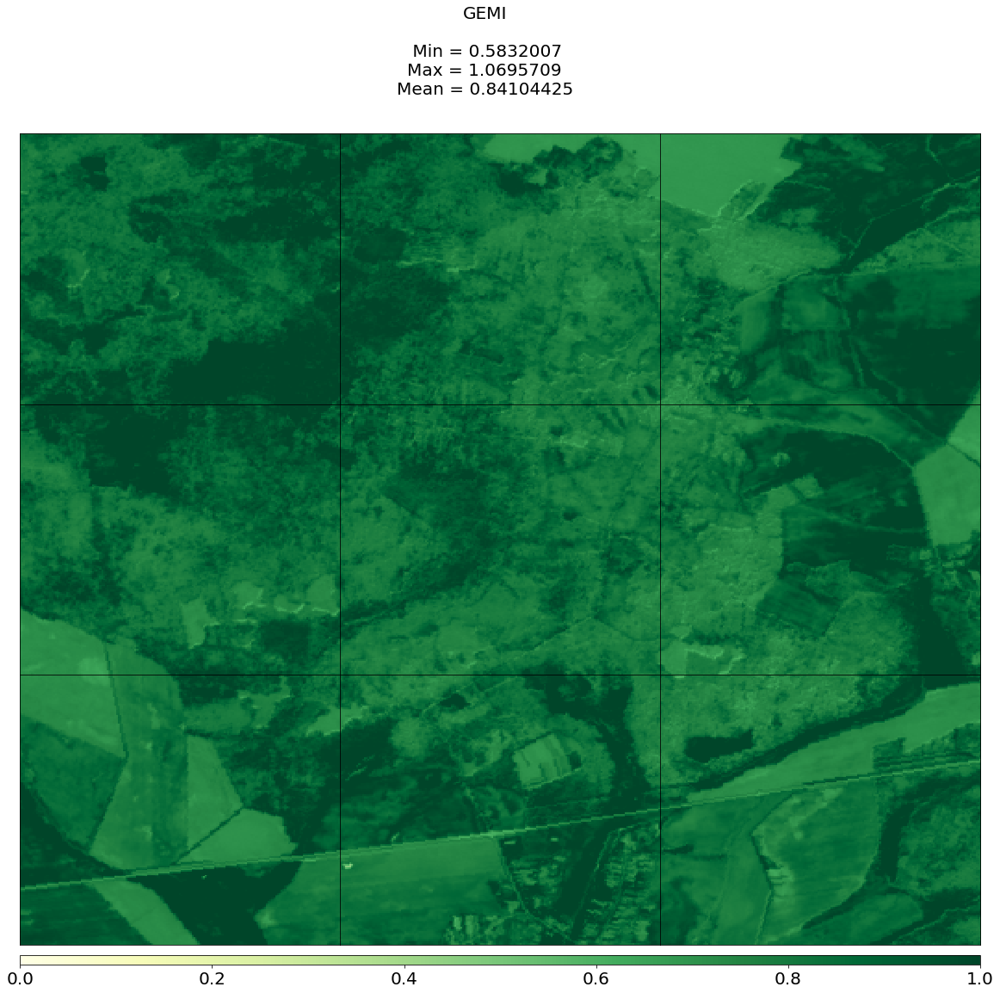

...

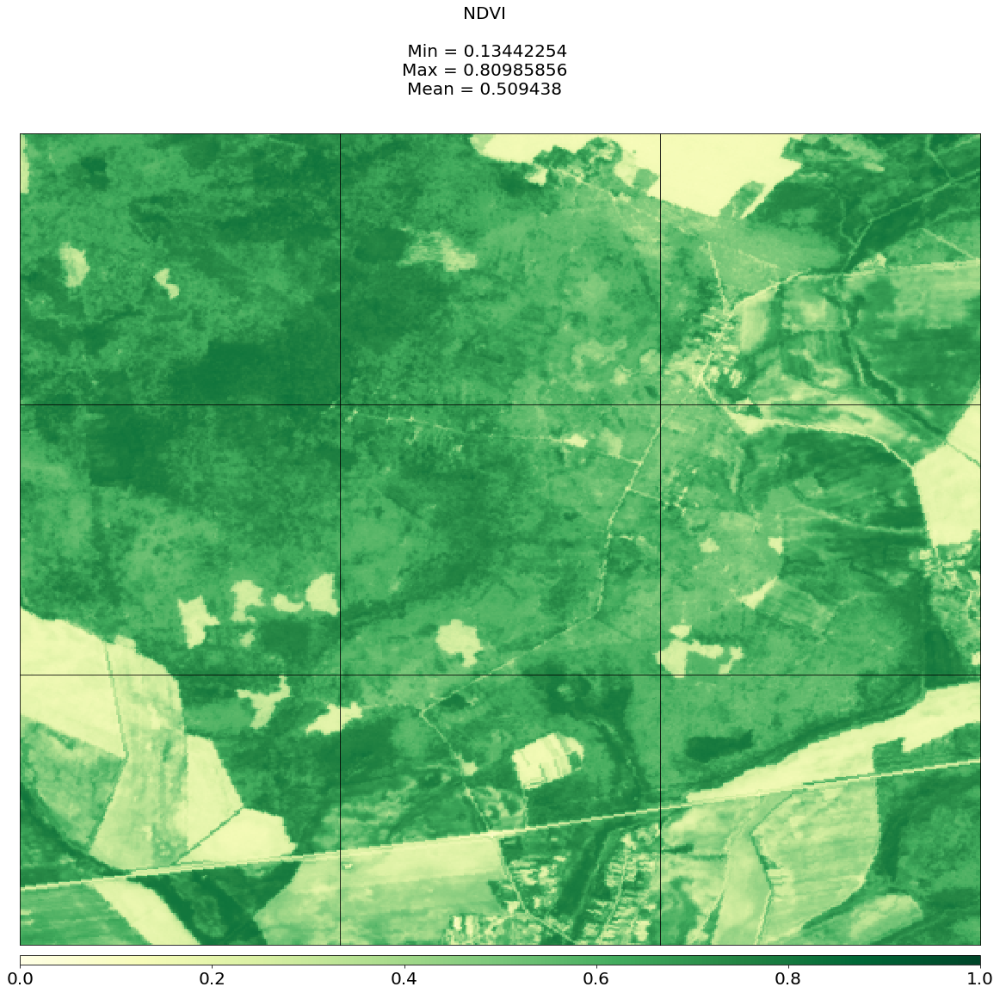

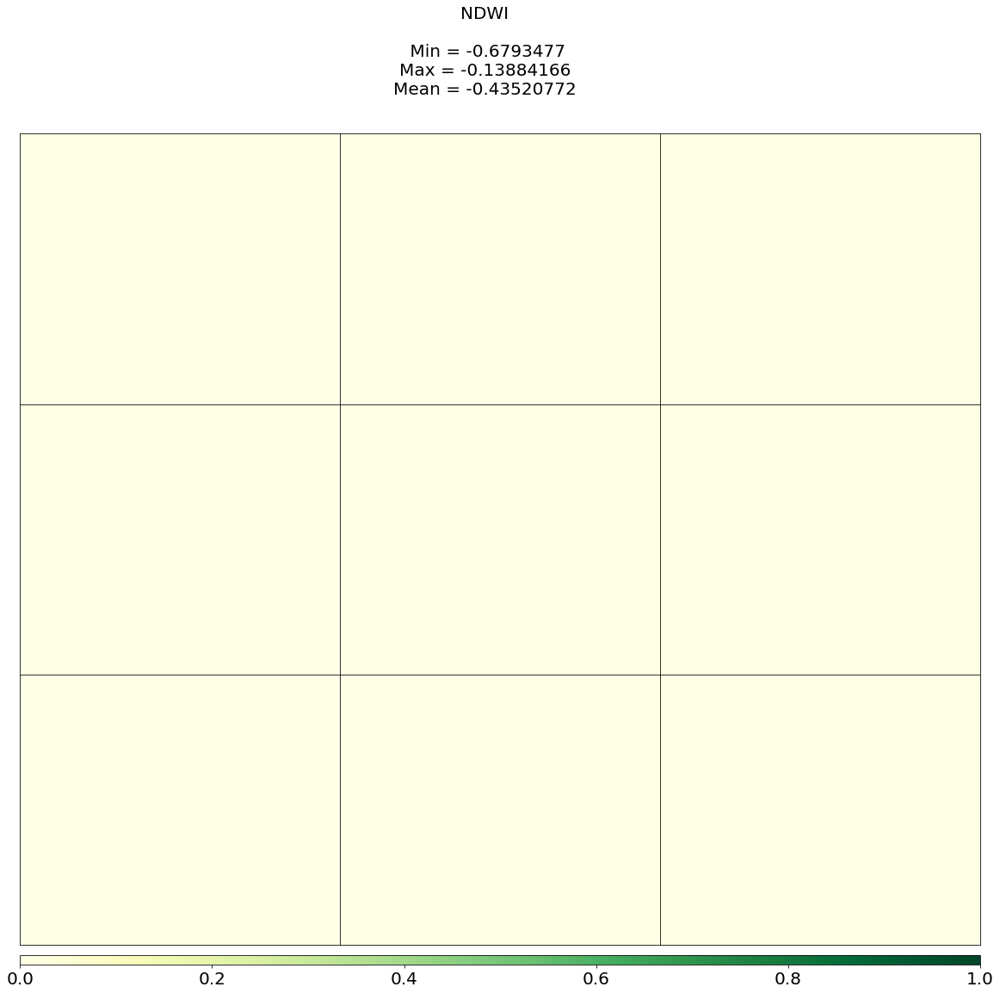

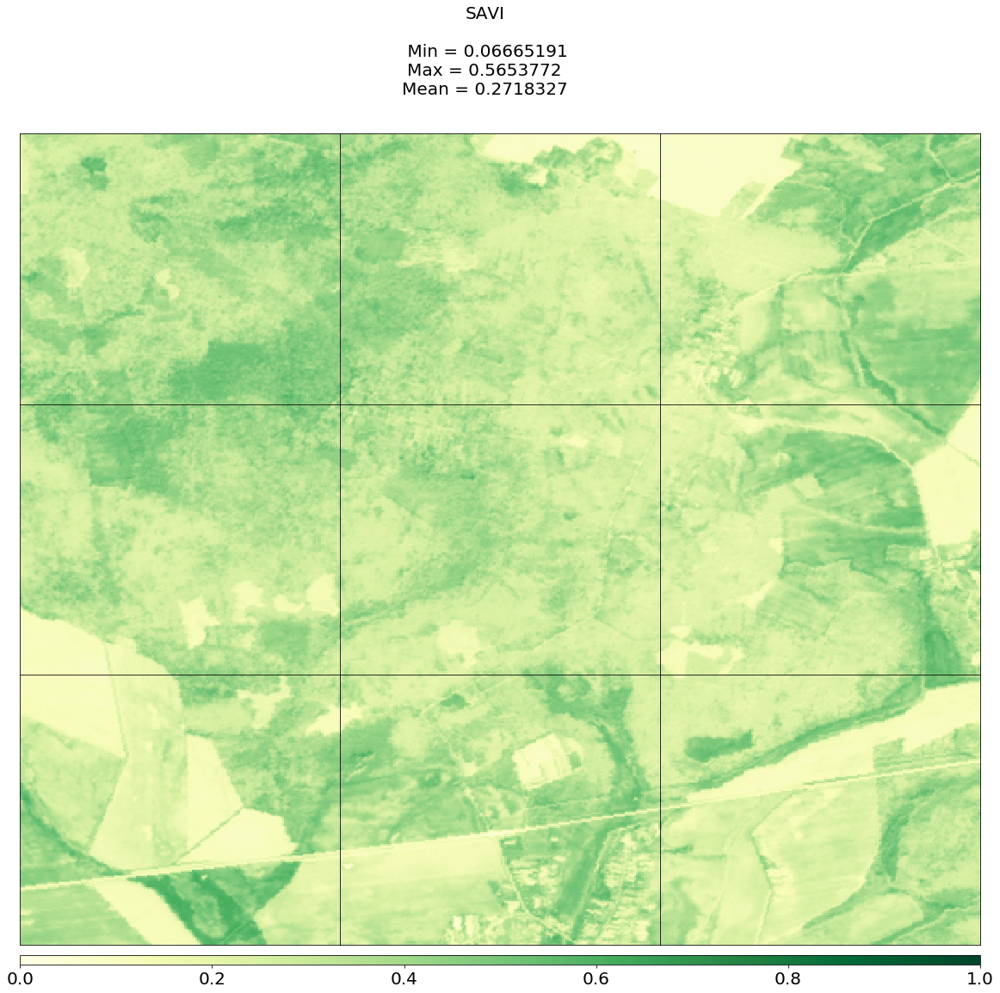

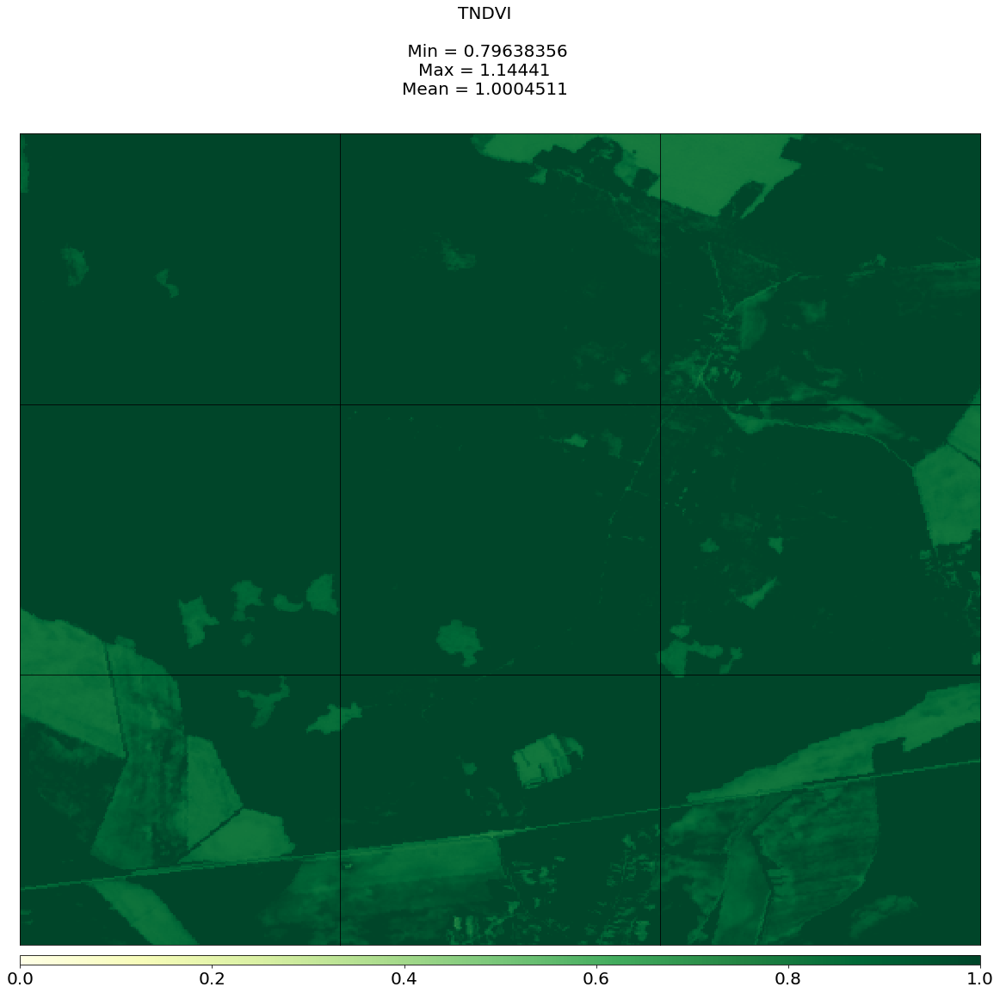

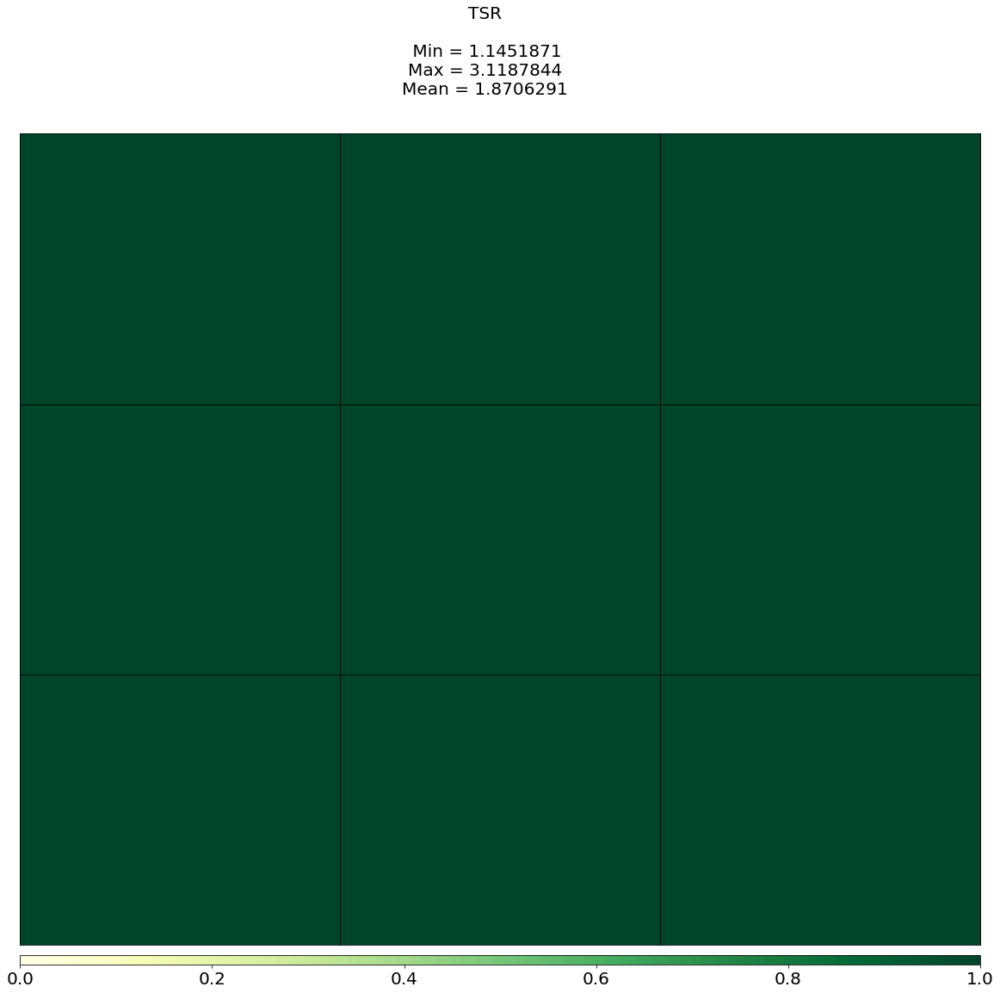

In [21]:
# часть 12. Визуализация рассчитанных индексов при единой шкале
# Рассчитанные индексы при равных входных максимальном и минимальном значениях (min = 0.0; max = 1.0)
# Для сравнения при единой шкале

indexs = ['ARVI', 'DI', 'DVI', 'EVI', 'GEMI', 'MSAVI', 'NDVI', 'NDWI', 'SAVI', 'TNDVI', 'TSR']

for x in indexs:
    path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'

    fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

    pbar = tqdm(total=9)
    for i, ax in enumerate(axes.flat):
        eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
        index = eopatch.data[x]
        mask = eopatch.mask['IS_VALID']
        index[~mask] = np.nan
        index_mean = np.nanmean(index, axis=0).squeeze()
        im = ax.imshow(index_mean, vmin=0, vmax=1.0, cmap=plt.get_cmap('YlGn'))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect("auto")
        pbar.update(1)
        del eopatch

    fig.subplots_adjust(wspace=0, hspace=0)
    supt = x + '\n\n Min = ' + str(np.amin(index_mean)) + '\nMax = ' + str(np.amax(index_mean)) + '\nMean = ' + str(np.mean(index_mean))
    fig.suptitle(supt, fontsize = 20)
    
    cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
    cb.ax.tick_params(labelsize=20)
    plt.show()    
    

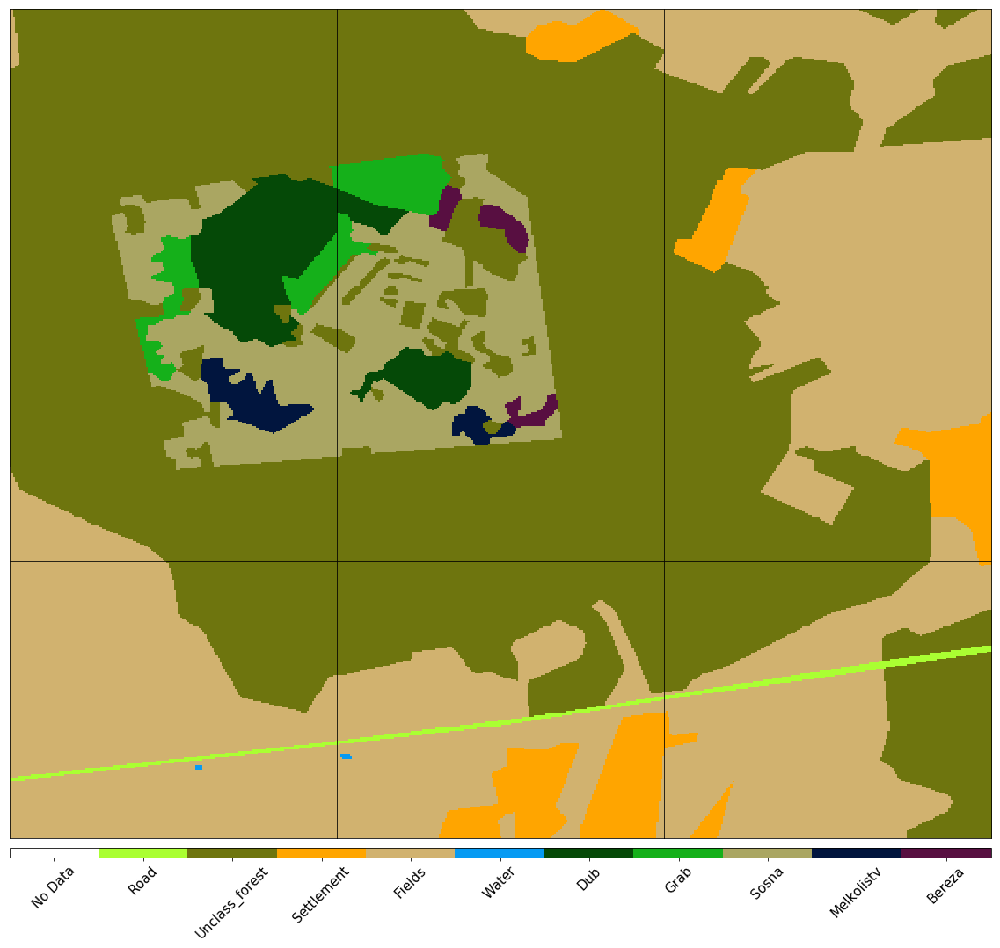

In [24]:
# Визуализация справочной карты
# *Справочная карта заменяет собой план землепользования здорового человека

path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'

fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

pbar = tqdm(total=9)
for i, ax in enumerate(axes.flat):
    eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
    im = ax.imshow(eopatch.mask_timeless['LULC'].squeeze(), cmap=lulc_cmap, norm=lulc_norm)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("auto")
    pbar.update(1)
    del eopatch

fig.subplots_adjust(wspace=0, hspace=0)

cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
cb.ax.tick_params(labelsize=20)
cb.set_ticks([entry.id for entry in LULC])
cb.ax.set_xticklabels([entry.class_name for entry in LULC], rotation=45, fontsize=15)
plt.show()

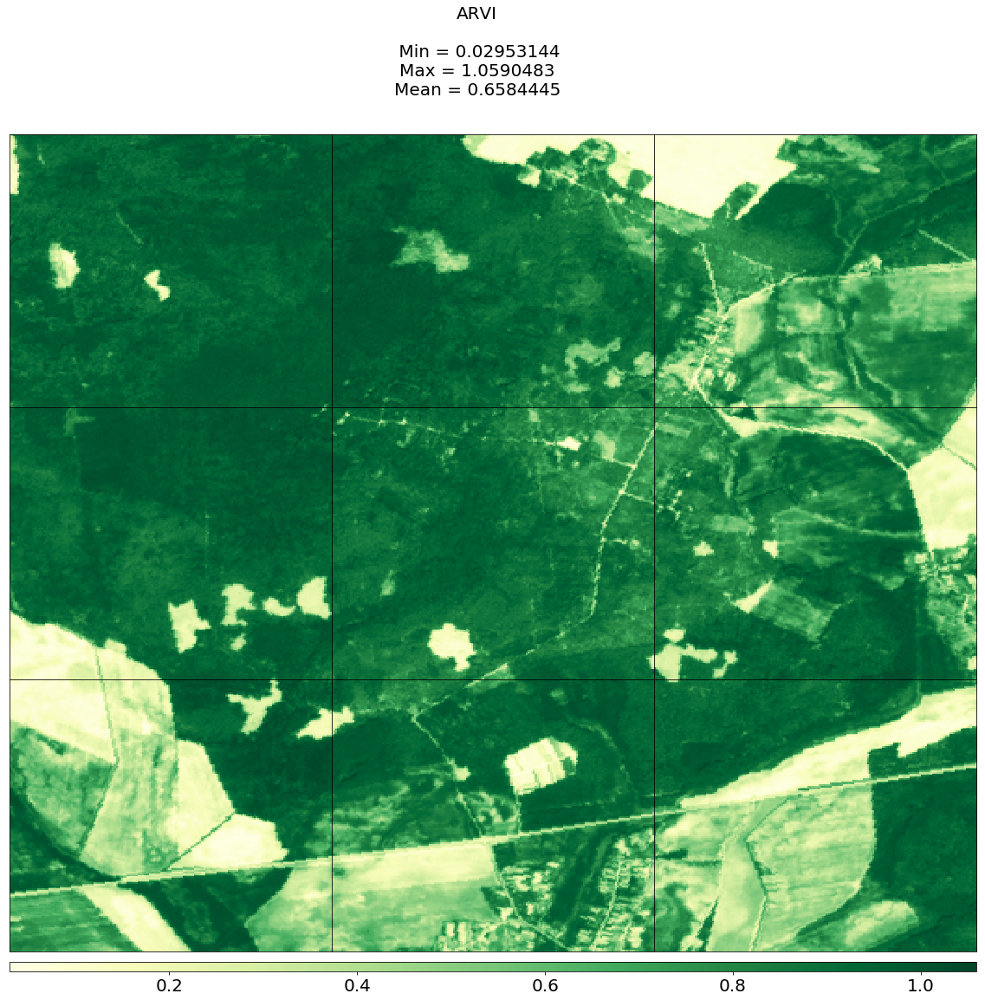

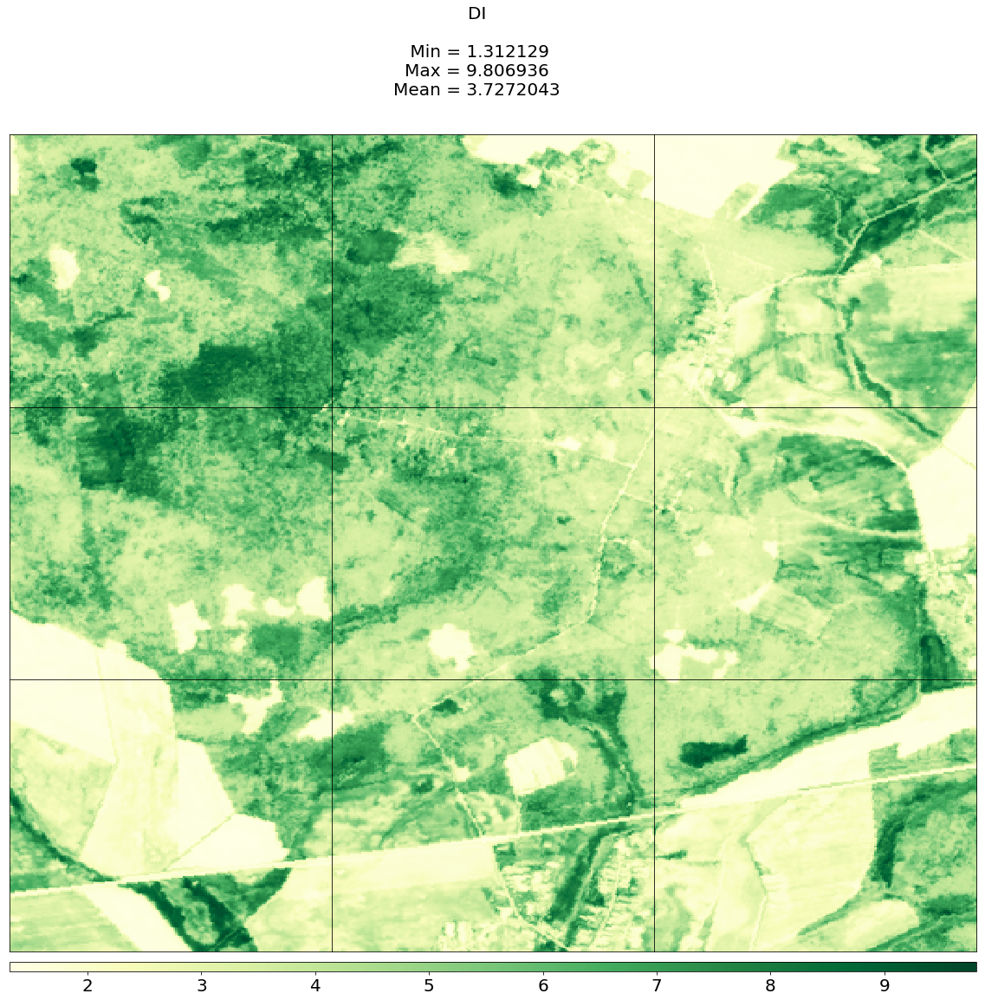

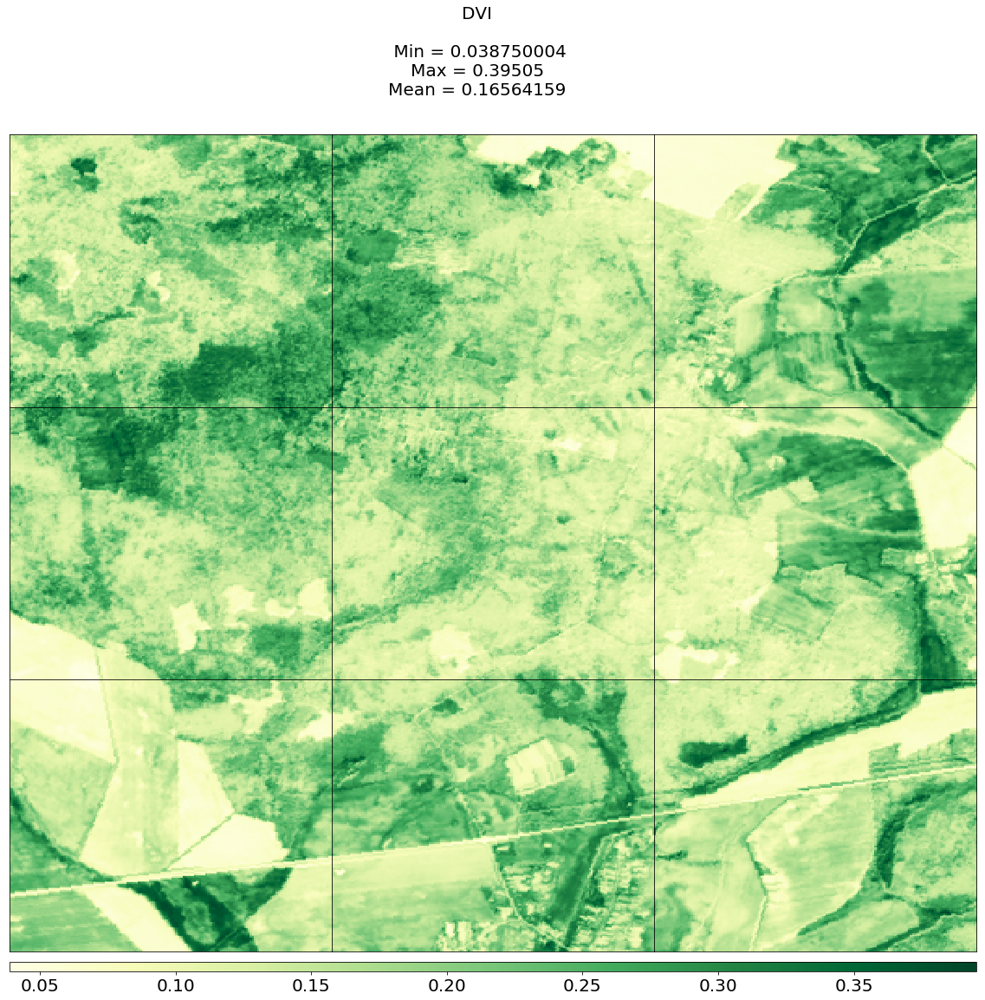

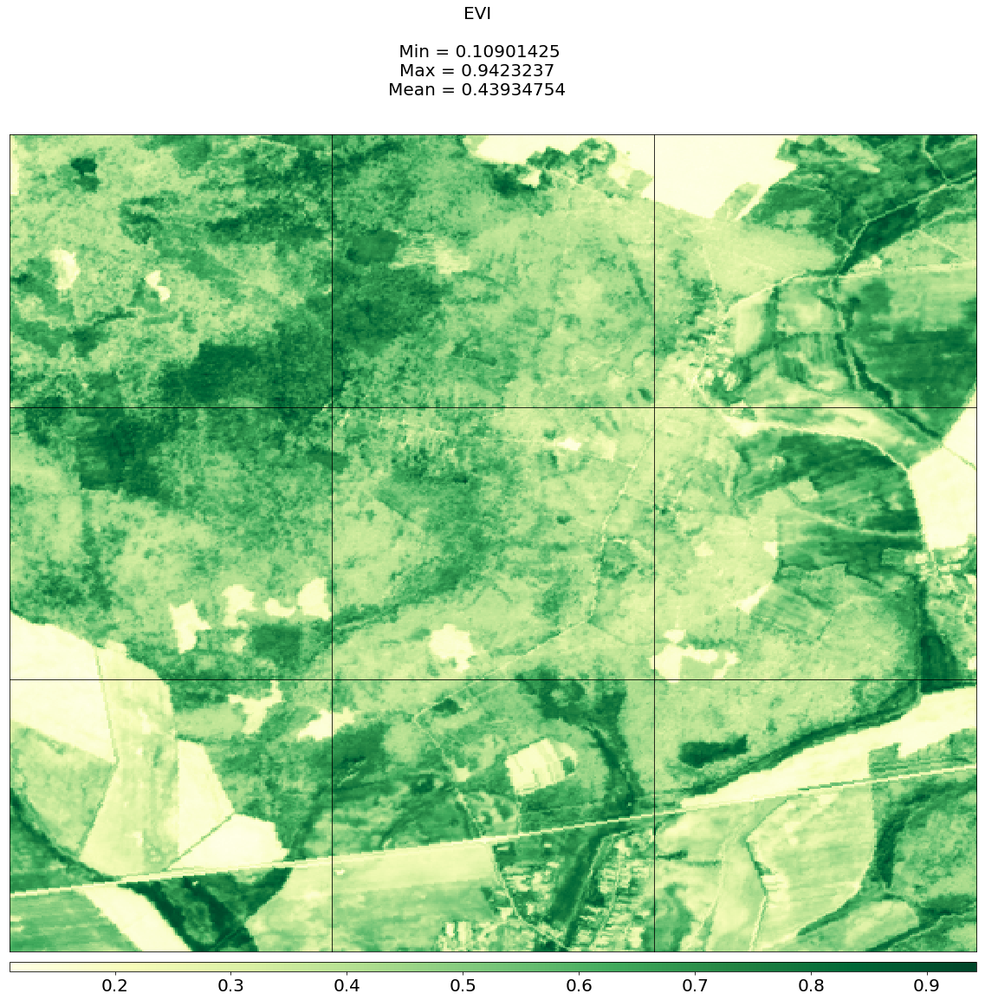

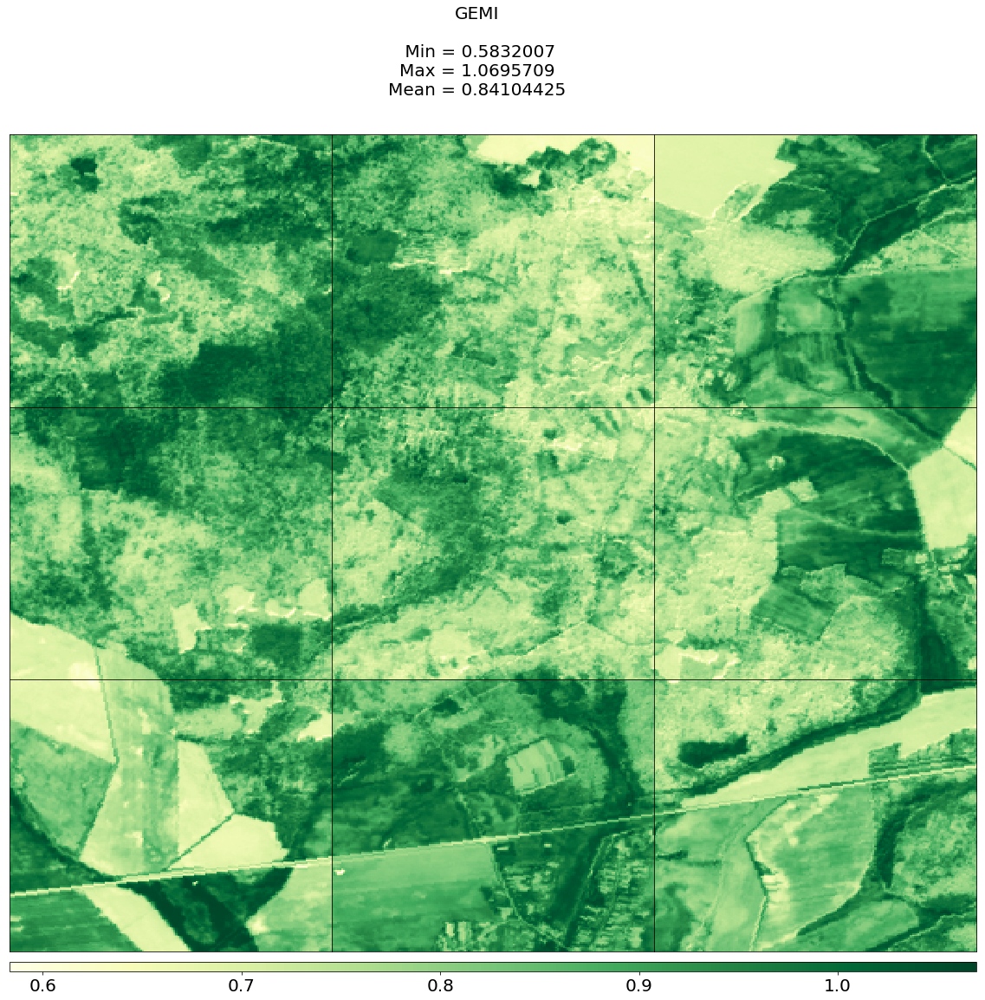

...

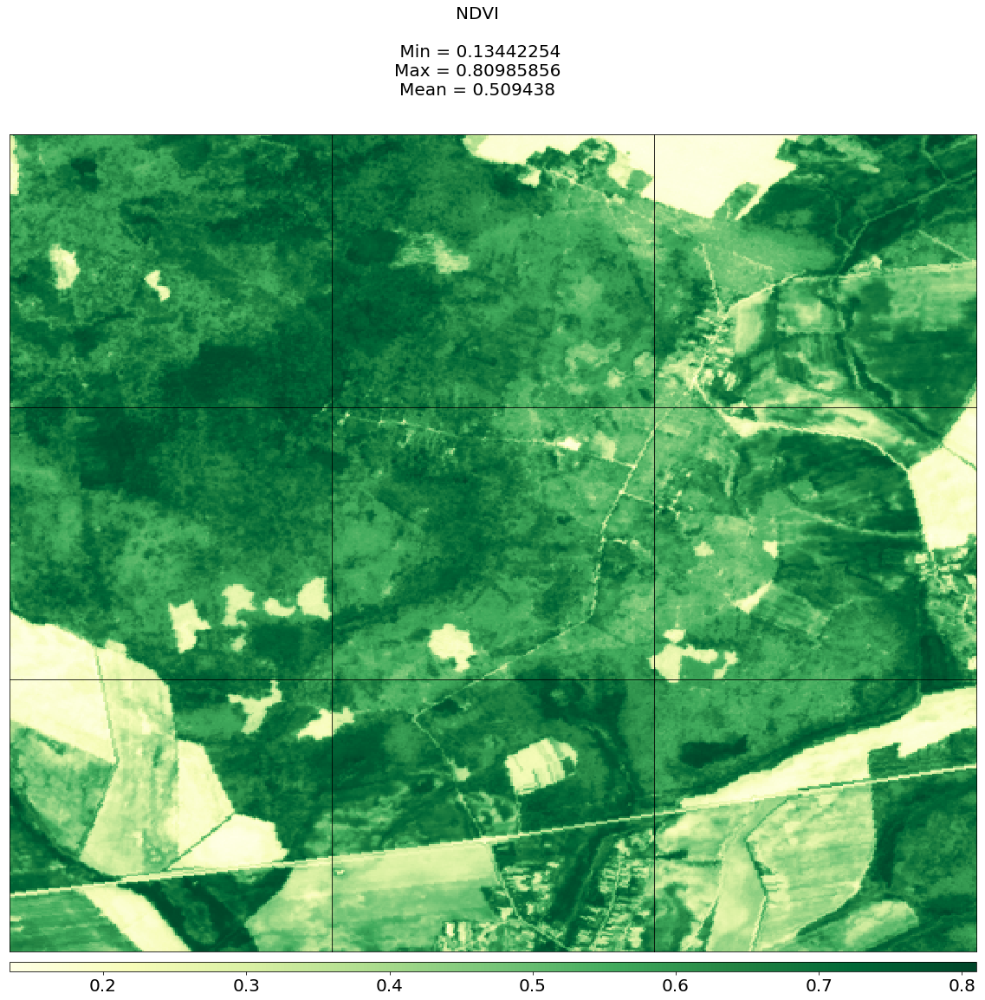

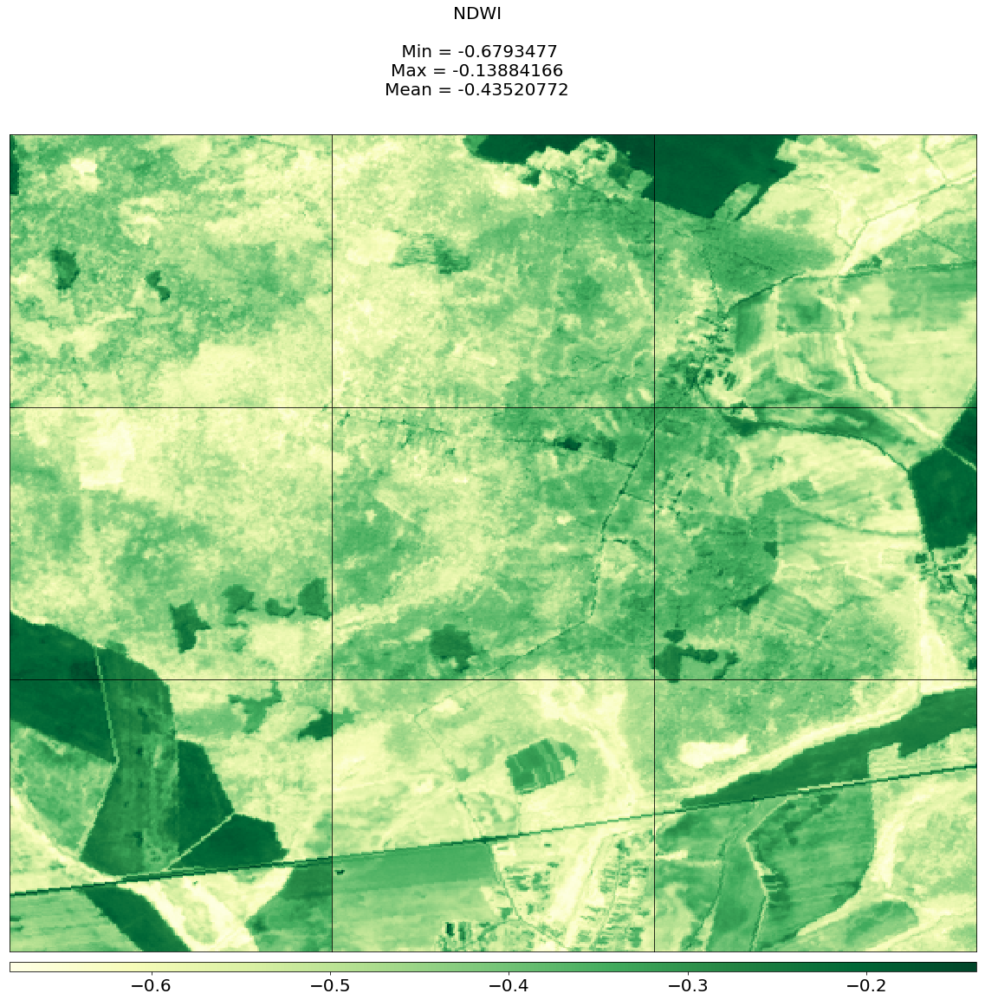

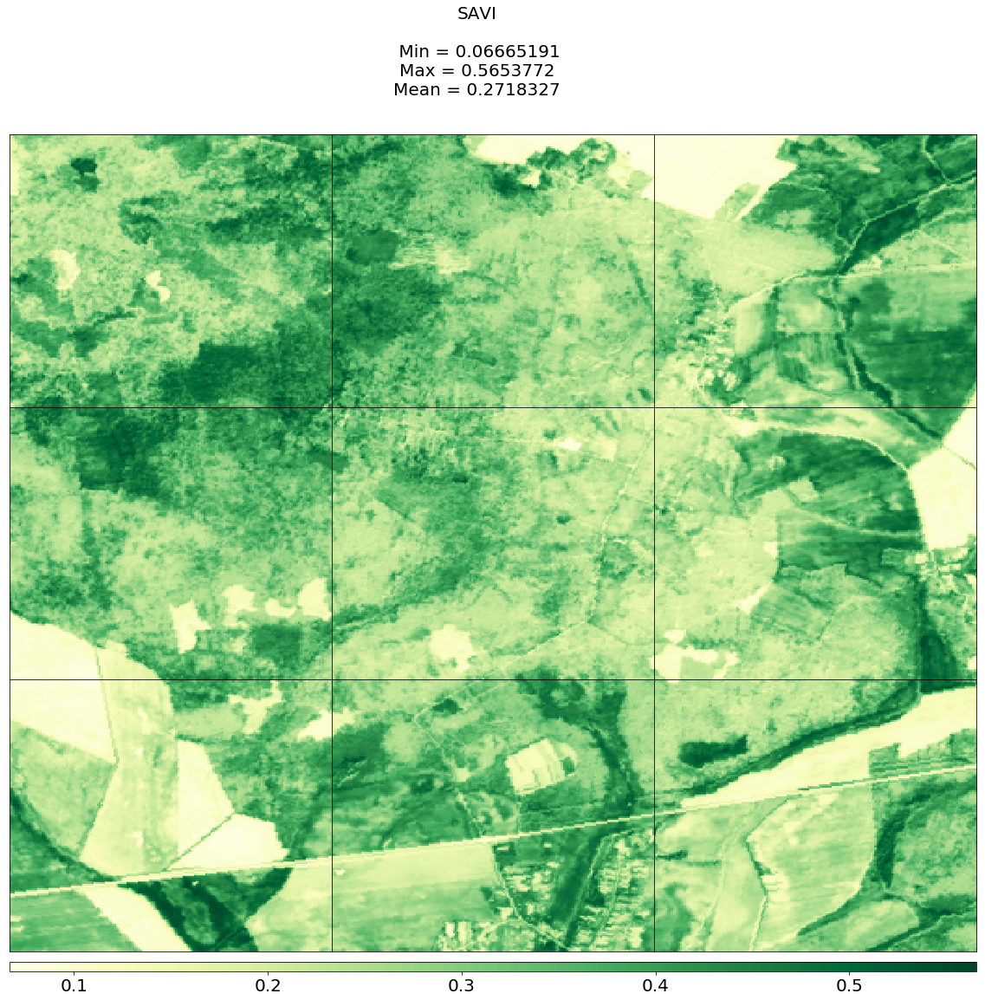

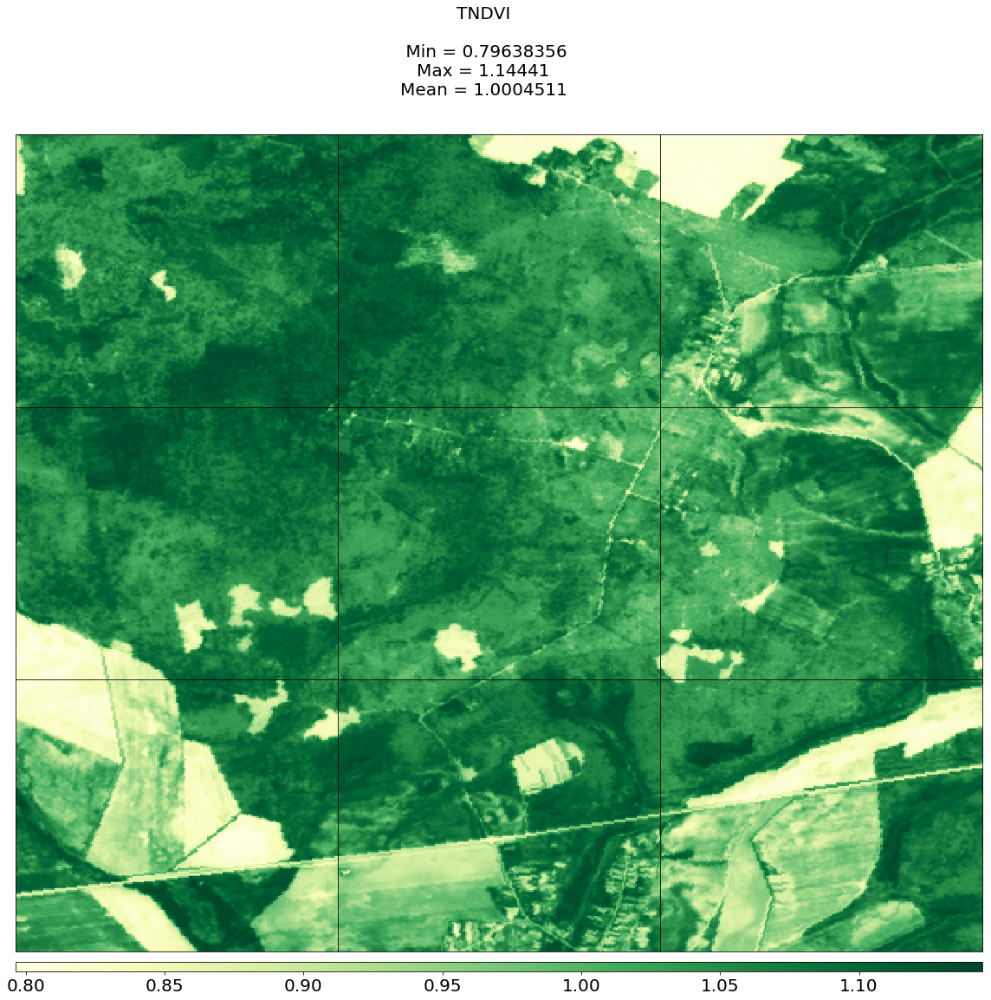

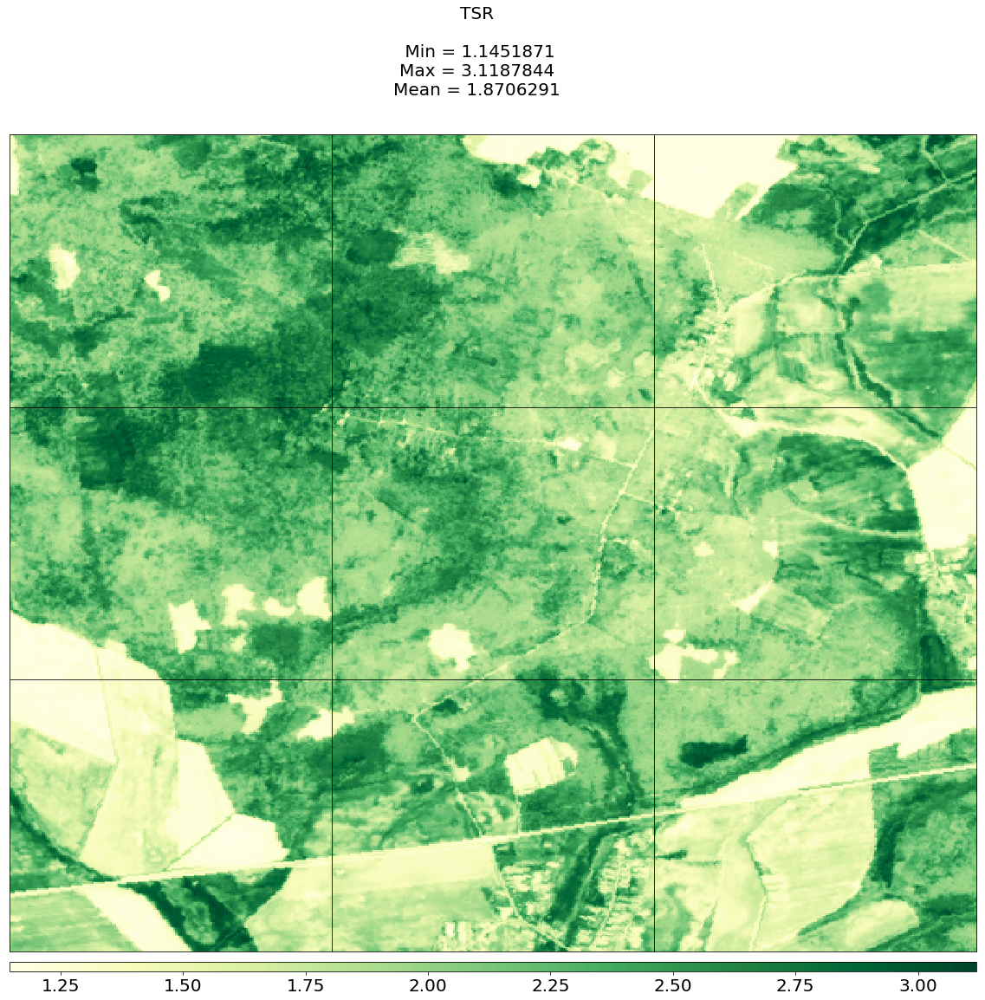

In [25]:
# часть 13. Визуализация рассчитанных индексов  при абсолютных значениях шкал
# Рассчитанные индексы при разных входных максимальном и минимальном значениях 
#(min = np.amin(index_mean); max = np.amax(index_mean))

indexs = ['ARVI', 'DI', 'DVI', 'EVI', 'GEMI', 'MSAVI', 'NDVI', 'NDWI', 'SAVI', 'TNDVI', 'TSR']

for x in indexs:
    path_out = './eopatches_small/' if use_smaller_patches else './eopatches_large/'
        
    fig, axes = plt.subplots(figsize=(20, 20 * aspect_ratio), nrows=3, ncols=3)

    pbar = tqdm(total=9)
    for i, ax in enumerate(axes.flat):
        eopatch = EOPatch.load('{}/eopatch_{}'.format(path_out, i), lazy_loading=True)
        index = eopatch.data[x]
        mask = eopatch.mask['IS_VALID']
        index[~mask] = np.nan
        index_mean = np.nanmean(index, axis=0).squeeze()
        im = ax.imshow(index_mean, vmin=np.amin(index_mean), vmax=np.amax(index_mean), cmap=plt.get_cmap('YlGn'))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect("auto")
        pbar.update(1)
        del eopatch

    fig.subplots_adjust(wspace=0, hspace=0)
    supt = x + '\n\n Min = ' + str(np.amin(index_mean)) + '\nMax = ' + str(np.amax(index_mean)) + '\nMean = ' + str(np.mean(index_mean))
    fig.suptitle(supt, fontsize = 20)
       
    cb = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.01, aspect=100)
    cb.ax.tick_params(labelsize=20)
    plt.show()
    
